# Visualizing the ontology enriched rare disease knowledge graph

The following data sources were processed into a knowledge graph:

* GARD diseases mapped to Orphanet and OMIM, with HPO and Gene annotations
    * The unionization and harmonization of these resources is part of the NCATS GARD 2.0 Data Lake effort, which is hosted on the NIH Palantir instance (https://nidap.nih.gov/workspace/data-integration/monocle/graph/ri.monocle.main.graph.680cedb9-a5f0-4974-9ff3-430460c48bdd?coloring=monocle.color.resource-type)
    * Relevant files: data/raw/gard2gene.csv and data/raw/gard2hpo.csv
    
* Pathway Commons biological pathway data in simple interaction format
    * Obtained from https://www.pathwaycommons.org/archives/PC2/v12/PathwayCommons12.All.hgnc.sif.gz
   
* Ontologies from OBO Foundry:
    * Gene Ontology - http://purl.obolibrary.org/obo/go.owl
    * The Human Phenotype Ontology - http://purl.obolibrary.org/obo/hp.owl
   
* Gene Target-Ligand data from the Pharos API (https://pharos.nih.gov/api)

These data sources were all merged into a single networkx multigraph object in the script src/data/construct_graph.py

**The purpose of this notebook is to perform exploratory data analysis and visualization on the resultant network**

   

In [1]:
import sys
import pickle
from collections import Counter
from itertools import combinations
from pathlib import Path
import random
import glob

import networkx as nx
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from scipy.stats import kde

from gensim.models import Word2Vec
from sklearn.manifold import TSNE, LocallyLinearEmbedding, MDS, Isomap
from sklearn import cluster,metrics
from sklearn.preprocessing import StandardScaler, Normalizer
from kneed import KneeLocator
%matplotlib inline

## Disease annotation ontology graph

In [2]:
with open('../data/processed/disease_ontograph.pkl', 'rb') as f:
    disease_ontograph = pickle.load(f)

#Remove unconnected components
components = [i for i in nx.connected_components(disease_ontograph)]
disease_ontograph = disease_ontograph.subgraph(components[0]).copy()

In [3]:
disease_ontograph_serialized = disease_ontograph.copy()


In [4]:
for node in disease_ontograph_serialized.nodes:
    for attrib in disease_ontograph_serialized.nodes[node]:
        if type(disease_ontograph_serialized.nodes[node][attrib]) == list:
            #disease_ontograph_serialized.nodes[node].update({attrib:' '.join(disease_ontograph_serialized.nodes[node][attrib])})
            print(disease_ontograph_serialized.nodes[node][attrib])

['"iron binding" EXACT []']
['GO:0046914']
['goslim_chembl', 'goslim_generic', 'goslim_plant']
['NIF_Subcellular:sao661522542', 'Wikipedia:Nucleoplasm']
['GO:0110165']
['part_of GO:0031981']
['GO:0031980']
['"mitochondrial lumen" EXACT []', '"mitochondrial stroma" NARROW []']
['NIF_Subcellular:sao1804523077', 'Wikipedia:Mitochondrial_matrix']
['GO:0070013']
['part_of GO:0005739']
['"glutathione metabolism" EXACT []', '"oxidized glutathione reduction" NARROW []']
['GO:0006518', 'GO:0006575', 'GO:0006790']
['goslim_chembl']
['"esterase activity" EXACT []']
['EC:3.1.-.-', 'Reactome:R-HSA-162729 "uPAR-acyl-GPI + H2O -> uPAR + long-chain fatty acid"', 'Reactome:R-HSA-9023617 "Butyrylcholinesterase hydrolyzes acyl Ghrelin"', 'Reactome:R-HSA-9023619 "Platelet-activating factor acetylhydrolase (PLA2G7) hydrolyzes acyl Ghrelin"']
['GO:0016787']
['goslim_chembl']
['"isoform-specific homophilic binding" EXACT [PMID:17889655]', '"protein homopolymerization" RELATED []']
['GO:0005515']
['"S-sulfany

['HP:0004431']
['"Body fails to respond to insulin" EXACT layperson [https://orcid.org/0000-0002-6548-5200]']
['MSH:D007333', 'SNOMEDCT_US:48606007', 'UMLS:C0021655']
['HP:0011014']
['PATO:0001552', 'qualifier PATO:0000460', 'towards CHEBI:5931']
['"High urine protein levels" EXACT layperson [ORCID:0000-0001-5208-3432]', '"Protein in urine" EXACT layperson []']
['MSH:D011507', 'SNOMEDCT_US:29738008', 'UMLS:C0033687']
['HP:0020129']
['"Diseased glomeruli" EXACT [https://orcid.org/0000-0001-5208-3432, https://orcid.org/0000-0002-6548-5200]']
['SNOMEDCT_US:197679002', 'UMLS:C0268731']
['HP:0000095']
['HP:0000335', 'HP:0005333']
['"Aged facial appearance" EXACT []', '"Premature aged appearance" EXACT layperson [ORCID:0000-0002-6548-5200]', '"Prematurely aged face" EXACT []', '"Prematurely aged facial appearance" EXACT []', '"Wizened face" EXACT []']
['UMLS:C1857710']
['HP:0007495']
['hposlim_core']
['"Atrophy of fat" EXACT [https://orcid.org/0000-0001-5208-3432, https://orcid.org/0000-0001

['GO:0065007', 'positively_regulates GO:0071605']
['positively_regulates GO:0071605']
['"positive regulation of CCL3 production" EXACT [GOC:mah]', '"positive regulation of chemokine (C-C motif) ligand 3 production" EXACT [GOC:mah]', '"positive regulation of macrophage inflammatory protein production" BROAD [GOC:mah]', '"positive regulation of MIP-1a production" EXACT [GOC:mah]']
['GO:0032722', 'GO:0071640']
['GO:0065007', 'positively_regulates GO:0071608']
['positively_regulates GO:0071608']
['"positive regulation of CCL5 production" EXACT [GOC:mah]', '"positive regulation of RANTES production" EXACT [GOC:bf]', '"positive regulation of Regulated upon Activation, Normal T-cell Expressed, and Secreted production" EXACT [GOC:mah]']
['GO:0032722', 'GO:0071649']
['GO:0065007', 'positively_regulates GO:0071609']
['positively_regulates GO:0071609']
['GO:0060232']
['GO:1990035']
['"calcium ion import into cell" EXACT []', '"calcium ion uptake into cell" EXACT [GOC:vw]']
['GO:0097553', 'GO:0098

['GO:0065007', 'positively_regulates GO:0030032']
['positively_regulates GO:0030032']
['"down regulation of macroautophagy" EXACT []', '"down-regulation of macroautophagy" EXACT []', '"downregulation of macroautophagy" EXACT []', '"inhibition of macroautophagy" NARROW []', '"negative regulation of starvation-induced autophagy" EXACT [GOC:ascb_2009, GOC:dph, GOC:tb]']
['GO:0010507', 'GO:0016241']
['GO:0065007', 'negatively_regulates GO:0016236']
['negatively_regulates GO:0016236']
['GO:0004429']
['"1-phosphatidylinositol 3-kinase activity" EXACT []', '"ATP:1-phosphatidyl-1D-myo-inositol 3-phosphotransferase activity" RELATED [EC:2.7.1.137]', '"phosphatidylinositol 3-kinase activity, class I" NARROW []', '"phosphatidylinositol 3-kinase activity, class II" NARROW []', '"phosphatidylinositol 3-kinase activity, class III" NARROW []', '"phosphatidylinositol 3-kinase, class I, catalyst activity" NARROW []', '"PI3-kinase activity" RELATED [EC:2.7.1.137]', '"PI3K" EXACT []', '"PtdIns-3-kinase a

['"positive regulation of hippo signaling cascade" RELATED [GOC:signaling]', '"positive regulation of hippo signaling pathway" EXACT []', '"positive regulation of hippo signalling cascade" RELATED [GOC:mah]']
['GO:0035330', 'GO:1902533']
['GO:0065007', 'positively_regulates GO:0035329']
['positively_regulates GO:0035329']
['GO:0030154']
['part_of GO:0007519']
['"activation of neuron differentiation" NARROW []', '"stimulation of neuron differentiation" NARROW []', '"up regulation of neuron differentiation" EXACT []', '"up-regulation of neuron differentiation" EXACT []', '"upregulation of neuron differentiation" EXACT []']
['GO:0045597', 'GO:0045664']
['GO:0065007', 'positively_regulates GO:0030182']
['positively_regulates GO:0030182']
['"activation of ossification" NARROW []', '"positive regulation of bone biosynthesis" EXACT []', '"positive regulation of bone formation" EXACT []', '"stimulation of ossification" NARROW []', '"up regulation of ossification" EXACT []', '"up-regulation of 

['HP:0007741', 'HP:0007743', 'HP:0008051']
['"Abnormal retinal pigmentation" EXACT []', '"Abnormality of retinal pigment epithelium" EXACT []', '"Abnormality of RPE" EXACT []', '"Abnormality of the retinal pigment epithelium" RELATED []', '"Retinal pigmentary anomaly" EXACT []']
['SNOMEDCT_US:421689001', 'UMLS:C1720508', 'UMLS:C1862475']
['HP:0000479']
['"Increased lactate dehydrogenase level" EXACT []']
['HP:0045040']
['http://purl.org/dc/elements/1.1/date 2017-04-23T17:11:02Z xsd:dateTime']
['HP:0003410', 'HP:0006815', 'HP:0007043', 'HP:0007142']
['"Damage to nerves that sense feeling" EXACT layperson [https://orcid.org/0000-0001-5208-3432, https://orcid.org/0000-0002-6548-5200]', '"Peripheral sensory neuropathy" EXACT []']
['SNOMEDCT_US:95662005', 'UMLS:C0151313']
['HP:0009830', 'HP:0045010']
['PATO:0001167', 'inheres_in UBERON:0001027', 'qualifier PATO:0000460']
['"Pituitary somatotropinoma" EXACT []']
['UMLS:C4018860']
['HP:0002893']
['"Abnormality of central motor function" EXACT

['NIF_Subcellular:sao118944228']
['GO:0031970']
['part_of GO:0005740']
['GO:0007005']
['part_of GO:0006915']
['goslim_aspergillus', 'goslim_candida', 'goslim_pir', 'goslim_yeast']
['"oxidative metabolic process" EXACT []', '"oxidative metabolism" EXACT []', '"respiration" BROAD []']
['Wikipedia:Cellular_respiration']
['GO:0015980']
['"ATP metabolism" EXACT []']
['GO:0008152']
['"2 Fe 2 S cluster binding" EXACT []', '"2 iron, 2 sulphur cluster binding" EXACT []', '"2Fe-2S cluster binding" EXACT []', '"diiron disulfide cluster binding" EXACT []', '"diiron disulphide cluster binding" EXACT []', '"iron-sulfur cluster 2Fe-2S binding" EXACT []', '"iron-sulphur cluster 2Fe-2S binding" EXACT []']
['GO:0051536']
['GO:0042391']
['"aa3-type cytochrome c oxidase" NARROW [EC:7.1.1.9]', '"ba3-type cytochrome c oxidase" NARROW [EC:7.1.1.9]', '"caa3-type cytochrome c oxidase" NARROW [EC:7.1.1.9]', '"cbb3-type cytochrome c oxidase" NARROW [EC:7.1.1.9]', '"complex IV (mitochondrial electron transport) a

['GO:0036503', 'GO:0043161']
['"protein dislocation from ER" EXACT [GOC:dph, GOC:krc]', '"protein retrotranslocation, ER to cytosol" EXACT [GOC:bf]', '"retrograde protein transport, endoplasmic reticulum to cytosol" EXACT []']
['GO:0032527', 'GO:1903513']
['part_of GO:0036503']
['"Cdc48p-Npl4p-Ufd1p AAA ATPase complex" NARROW []', '"p97-Ufd1-Npl4 complex" EXACT [PMID:12847084]']
['GO:0098796', 'GO:0140534']
['has_part GO:0036501', 'part_of GO:0005789']
['"SG disassembly" EXACT [PMID:19825938]']
['GO:0032988', 'GO:1903008']
['GO:0016504']
['GO:0098772', 'positively_regulates GO:0101005']
['part_of GO:2000158', 'positively_regulates GO:0101005']
['"ICL repair" EXACT [PMID:20658649]']
['GO:0006281']
['Reactome:R-HSA-5683077 "RNF8 and RNF168 ubiquitinate KDM4A,B"']
['GO:0031593']
['"Derlin-1 complex" EXACT [PMID:18555783]', '"Derlin-1 protein dislocation complex" EXACT [PMID:18555783]', '"Derlin-1 retro-translocation complex" EXACT [GOC:bf]', '"Derlin-1 retrotranslocon" EXACT [GOC:bf]', '"

['"regulation of deubiquitinase activity" EXACT []', '"regulation of UBP" RELATED [GOC:obol]', '"regulation of UCH2" RELATED [GOC:obol]']
['GO:0052547']
['GO:0065007', 'regulates GO:0004843']
['regulates GO:0004843']
['"Brisk knee jerk" RELATED layperson []', '"Hyperreflexia in knees" EXACT []', '"Overactive knee reflex" EXACT layperson [ORCID:0000-0001-6908-9849]']
['UMLS:C0240116']
['HP:0002395']
['"Vertical gaze palsy" EXACT []']
['SNOMEDCT_US:246773002', 'UMLS:C0339652', 'UMLS:C1843369']
['HP:0000605']
['"Tongue dystonia" EXACT []']
['HP:0012179']
['http://purl.org/dc/elements/1.1/date 2017-05-13T21:10:32Z xsd:dateTime']
['"Difficulty in lingual movements" EXACT [ORCID:0000-0001-5889-4463]', '"Difficulty in tongue movements" EXACT layperson []', '"Hypokinesia of the tongue" NARROW [ORCID:0000-0001-5889-4463]', '"Lingual hypokinesia" NARROW [ORCID:0000-0001-5889-4463]']
['UMLS:C1853406', 'UMLS:C4280676']
['HP:0000182']
['UMLS:C4023352']
['HP:0012638']
['"Loss of articulate speech" E

['EC:2.7.12.2', 'MetaCyc:2.7.12.2-RXN', 'Reactome:R-HSA-1247960 "Activation of p38 MAPK"', 'Reactome:R-HSA-3238999 "Activated human MKK3/MKK6 phosphorylates p38 MAPK complexed with MAPKAPK5"', 'Reactome:R-HSA-448951 "Activation of p38 alpha/beta MAPK"', 'Reactome:R-HSA-450333 "Activated human MKK3/MKK6 phosphorylates p38 MAPK complexed with MAPKAPK2 or MAPKAPK3"', 'Reactome:R-HSA-5218804 "p38 MAPK activation by VEGFR"']
['GO:0004712']
['part_of GO:0000165']
['GO:0004710']
['"ATP:protein phosphotransferase (MAPKKKK-activated) activity" RELATED [EC:2.7.11.25]', '"cMos" RELATED [EC:2.7.11.25]', '"cRaf" RELATED [EC:2.7.11.25]', '"MAP3K" RELATED [EC:2.7.11.25, PMID:20811974]', '"MAPK/ERK kinase kinase activity" EXACT []', '"MAPKKK activity" RELATED [EC:2.7.11.25]', '"MEK kinase activity" RELATED [EC:2.7.11.25]', '"MEKK" RELATED [EC:2.7.11.25]', '"MEKK activity" EXACT []', '"MEKK1" RELATED [EC:2.7.11.25]', '"MEKK2" RELATED [EC:2.7.11.25]', '"MEKK3" RELATED [EC:2.7.11.25]', '"Mil/Raf" RELATED

['"Microcephaly, postnatal, progressive" EXACT []', '"Microcephaly, progressive" EXACT [HPO:skoehler]', '"Progressively abnormally small cranium" EXACT layperson [ORCID:0000-0001-5889-4463]', '"Progressively abnormally small skull" EXACT layperson [ORCID:0000-0001-5889-4463]']
['UMLS:C1850456']
['HP:0005484']
['PATO:0000587', 'inheres_in UBERON:0000033', 'qualifier PATO:0000460', 'qualifier PATO:0001818']
['"Food intolerance" EXACT layperson []', '"Non-allergic food hypersensitivity" EXACT []']
['SNOMEDCT_US:235719002', 'UMLS:C0149696']
['HP:0012337']
['HP:0003446']
['"Chronic sural axonal neuropathy" EXACT []']
['UMLS:C4021578']
['HP:0003477']
['SNOMEDCT_US:2776000', 'UMLS:C1306587']
['HP:0001298']
['HP:0200061']
['hposlim_core']
['"Bulging forehead" RELATED layperson []', '"Prominence of frontal region" EXACT [ORCID:0000-0001-5889-4463]', '"Prominent forehead" EXACT layperson []', '"Pronounced forehead" EXACT layperson [ORCID:0000-0001-5889-4463]', '"Protruding forehead" EXACT layper

['"down regulation of short-term synaptic potentiation" EXACT [GOC:TermGenie]', '"down regulation of synaptic facilitation" EXACT [GOC:TermGenie]', '"down-regulation of short-term synaptic potentiation" EXACT [GOC:TermGenie]', '"down-regulation of synaptic facilitation" EXACT [GOC:TermGenie]', '"downregulation of short-term synaptic potentiation" EXACT [GOC:TermGenie]', '"downregulation of synaptic facilitation" EXACT [GOC:TermGenie]', '"inhibition of short-term synaptic potentiation" NARROW [GOC:TermGenie]', '"inhibition of synaptic facilitation" NARROW [GOC:TermGenie]', '"negative regulation of synaptic facilitation" EXACT [GOC:TermGenie]']
['GO:0048519', 'GO:1905512']
['GO:0065007', 'negatively_regulates GO:1990926']
['negatively_regulates GO:1990926']
['goslim_pir']
['"voltage gated calcium channel complex" EXACT []', '"voltage-dependent calcium channel complex" EXACT []', '"voltage-sensitive calcium channel complex" EXACT []']
['GO:0034704', 'GO:0098797']
['goslim_agr', 'goslim_ch

['GO:0003845']
['goslim_chembl']
['GO:0005515']
['RO:0002161 NCBITaxon:4751']
['GO:0072506']
['"activation of keratinocyte apoptosis" NARROW [GOC:TermGenie]', '"activation of keratinocyte apoptotic process" NARROW [GOC:TermGenie]', '"positive regulation of keratinocyte apoptosis" NARROW [GOC:TermGenie]', '"up regulation of keratinocyte apoptosis" NARROW [GOC:TermGenie]', '"up regulation of keratinocyte apoptotic process" EXACT [GOC:TermGenie]', '"up-regulation of keratinocyte apoptosis" NARROW [GOC:TermGenie]', '"up-regulation of keratinocyte apoptotic process" EXACT [GOC:TermGenie]', '"upregulation of keratinocyte apoptosis" NARROW [GOC:TermGenie]', '"upregulation of keratinocyte apoptotic process" EXACT [GOC:TermGenie]']
['GO:1902172', 'GO:1904037']
['GO:0065007', 'positively_regulates GO:0097283']
['positively_regulates GO:0097283']
['"negative regulation of beta-catenin-independent Wnt receptor signaling pathway" EXACT [GOC:obol]', '"negative regulation of non-canonical Wnt recepto

['"activation of MHC class II biosynthetic process" NARROW []', '"positive regulation of major histocompatibility complex class II biosynthesis" EXACT []', '"positive regulation of major histocompatibility complex class II biosynthetic process" EXACT []', '"positive regulation of MHC class II anabolism" EXACT []', '"positive regulation of MHC class II biosynthesis" EXACT []', '"positive regulation of MHC class II formation" EXACT []', '"positive regulation of MHC class II synthesis" EXACT []', '"stimulation of MHC class II biosynthetic process" NARROW []', '"up regulation of MHC class II biosynthetic process" EXACT []', '"up-regulation of MHC class II biosynthetic process" EXACT []', '"upregulation of MHC class II biosynthetic process" EXACT []']
['GO:0010557', 'GO:0045346']
['GO:0065007', 'positively_regulates GO:0045342']
['positively_regulates GO:0045342']
['"down regulation of progression through mitotic cell cycle" EXACT []', '"down-regulation of progression through mitotic cell c

['UMLS:C4022907']
['HP:0012378']
['"Abnormal blood K concentration" EXACT abbreviation []', '"Abnormality of potassium homeostasis" EXACT []']
['UMLS:C4023575']
['HP:0010930']
['"Schistocytes" EXACT []']
['SNOMEDCT_US:385472000', 'UMLS:C0344386']
['HP:0004447']
['HP:0001893']
['"Abnormally shaped erythrocytes" EXACT [ORCID:0000-0001-6908-9849]', '"Erythrocytosis" EXACT []', '"Increased red blood cells" EXACT layperson [ORCID:0000-0002-6548-5200]', '"Polyglobulia" EXACT []']
['MSH:D011086', 'SNOMEDCT_US:109992005', 'SNOMEDCT_US:127062003', 'UMLS:C0032461', 'UMLS:C1527405']
['HP:0001877']
['PATO:0002002', 'qualifier PATO:0000460', 'qualifier PATO:0001869', 'towards CL:0000081']
['"Increased MCH" EXACT abbreviation []', '"Increased MCHC" EXACT abbreviation []', '"Increased mean corpuscular haemoglobin" EXACT uk_spelling []', '"Increased mean corpuscular haemoglobin concentration" EXACT uk_spelling []', '"Increased mean corpuscular Hb concentration" EXACT abbreviation []']
['HP:0025546']
[

['SNOMEDCT_US:250274006', 'UMLS:C0427515']
['HP:0010974']
['PATO:0000051', 'inheres_in_part_of CL:0000094', 'qualifier PATO:0000460']
['"Eclabium" EXACT []', '"Everted lips" EXACT [ORCID:0000-0001-5889-4463]', '"Outward turned lips" EXACT layperson [ORCID:0000-0001-5889-4463]']
['UMLS:C3550430']
['HP:0000159']
['HP:0001490', 'HP:0007978']
['"Subcapsular cataracts" EXACT []', '"Subcapsular lenticular cataracts" EXACT []', '"Subcapsular opacities" EXACT []']
['SNOMEDCT_US:95723009', 'UMLS:C0235259']
['HP:0000518']
['"spliceosome assembly" BROAD []']
['GO:0022618']
['part_of GO:0000398']
['"spliceosomal snRNP biogenesis" RELATED [GOC:mah]']
['GO:0022618']
['part_of GO:0000398']
['GO:0001125']
['goslim_yeast']
['"DNA-dependent transcription, termination" EXACT [GOC:txnOH]', '"termination of DNA-dependent transcription" EXACT [GOC:jh2]', '"termination of transcription, DNA-dependent" EXACT [GOC:mah]', '"transcription termination factor activity" RELATED []', '"transcription termination from

['part_of GO:0007178']
['GO:0010611', 'GO:0014741']
['GO:0065007', 'negatively_regulates GO:0003300']
['negatively_regulates GO:0003300']
['"ARF complex" EXACT []']
['GO:0090575']
['"somite rostrocaudal axis specification" EXACT []', '"somite rostrocaudal polarity" RELATED []']
['GO:0000578', 'GO:0009948']
['part_of GO:0001756']
['"regulation of TGF-B2 production" EXACT []', '"regulation of TGFB2 production" EXACT []', '"regulation of transforming growth factor-beta2 production" EXACT [GOC:bf]']
['GO:0071634']
['GO:0065007', 'regulates GO:0032906']
['regulates GO:0032906']
['"activation of luteinizing hormone secretion" NARROW []', '"stimulation of luteinizing hormone secretion" NARROW []', '"up regulation of luteinizing hormone secretion" EXACT []', '"up-regulation of luteinizing hormone secretion" EXACT []', '"upregulation of luteinizing hormone secretion" EXACT []']
['GO:0032278', 'GO:0033684']
['GO:0065007', 'positively_regulates GO:0032275']
['positively_regulates GO:0032275']
['G

['PATO:0000645', 'inheres_in UBERON:0001870', 'qualifier PATO:0000460']
['"Absent/small collarbone" EXACT layperson [ORCID:0000-0001-5208-3432]', '"Absent/underdeveloped collarbone" EXACT layperson [ORCID:0000-0001-5208-3432]']
['UMLS:C4024993']
['HP:0000889', 'HP:0006496', 'HP:0006711']
['PATO:0002290', 'inheres_in UBERON:0001105', 'qualifier PATO:0000460']
['"Slender long bones with narrow shaft" EXACT layperson [ORCID:0000-0001-5208-3432]']
['UMLS:C2675547']
['HP:0000940', 'HP:0003100']
['HP:0200087']
['"Decreased height of upper lip" EXACT layperson [ORCID:0000-0001-5889-4463]', '"Decreased upper labial height" EXACT [ORCID:0000-0001-5889-4463]', '"Decreased upper labial length" EXACT [ORCID:0000-0001-5889-4463]', '"Decreased vertical length of upper lip" EXACT layperson [ORCID:0000-0001-5889-4463]', '"Short upper lip" EXACT layperson []', '"Shortening of upper lip" EXACT layperson [ORCID:0000-0001-5889-4463]', '"Vertical deficiency of upper lip" EXACT [ORCID:0000-0001-5889-4463]']

['GO:0065007', 'positively_regulates GO:0035556']
['GO:0006476', 'GO:0016570']
['"histone H3 K9 methylation" EXACT []', '"histone H3K9me" EXACT []', '"histone lysine H3 K9 methylation" EXACT []']
['GO:0034968', 'GO:0061647']
['MSH:D065306', 'SNOMEDCT_US:95726001', 'UMLS:C0349702']
['HP:0007957', 'HP:0100699']
['PATO:0001850', 'inheres_in UBERON:0000964', 'qualifier PATO:0000460']
['"Abnormality of hair color" EXACT layperson [ORCID:0000-0001-5889-4463]', '"Abnormality of hair colour" EXACT uk_spelling []', '"Abnormality of hair pigmentation" EXACT layperson []']
['UMLS:C4024172']
['HP:0001595']
['hposlim_core']
['"Soft skin" EXACT layperson []', '"Velvety skin" RELATED layperson []', '"Velvety skin texture" RELATED layperson [HPO:skoehler]']
['UMLS:C0241178', 'UMLS:C1844592']
['HP:0010647']
['PATO:0000387', 'inheres_in UBERON:0002097', 'qualifier PATO:0000460']
['hposlim_core']
['UMLS:C3887531']
['HP:0007700', 'HP:0100689', 'HP:0100692']
['MSH:D009902', 'SNOMEDCT_US:66760008', 'UMLS:C0

['PATO:0000591', 'inheres_in UBERON:0016422', 'qualifier PATO:0000460']
['HP:0005869']
['"Lower jaw bone infection" EXACT layperson []', '"Osteomyelitis, especially of the mandible" EXACT []']
['SNOMEDCT_US:109695005', 'UMLS:C1290708']
['HP:0000277', 'HP:0002754']
['"acetylgalactosamine 4-sulfatase activity" RELATED [EC:3.1.6.12]', '"arylsulfatase B" EXACT []', '"chondroitinsulfatase" BROAD [EC:3.1.6.12]', '"N-acetyl-D-galactosamine-4-sulfate 4-sulfohydrolase activity" RELATED [EC:3.1.6.12]', '"N-acetylgalactosamine 4-sulfate sulfohydrolase activity" RELATED [EC:3.1.6.12]', '"N-acetylgalactosamine-4-sulphatase activity" EXACT []']
['EC:3.1.6.12', 'MetaCyc:3.1.6.12-RXN', 'Reactome:R-HSA-1606789 "ARSB hydrolyses DS"', 'Reactome:R-HSA-1793207 "ARSB hydrolyses C4S/C6S chains"', 'Reactome:R-HSA-2282889 "Defective ARSB does not hydrolyse C4S/C6S chains"', 'Reactome:R-HSA-9036065 "Defective ARSB does not hydrolyse DS"', 'Wikipedia:Arylsulfatase_B']
['GO:0008484']
['GO:0061582']
['"Abnormal de

['HP:0000388']
['http://purl.org/dc/elements/1.1/date 2017-08-27T14:53:18Z xsd:dateTime']
['"Abnormal shape of molar tooth" EXACT layperson [ORCID:0000-0001-5889-4463]', '"Abnormality of molar morphology" EXACT []']
['UMLS:C4023553']
['HP:0006482', 'HP:0011077']
['PATO:0000051', 'inheres_in UBERON:0003655', 'qualifier PATO:0000460']
['"triacylglycerol metabolic process" EXACT []', '"triacylglycerol metabolism" EXACT []', '"triglyceride metabolism" EXACT []']
['GO:0006639']
['GO:0000768']
['part_of GO:0014902']
['"lipid raft organization" EXACT [GOC:mah]', '"membrane raft organisation" EXACT [GOC:mah]', '"membrane raft organization and biogenesis" RELATED [GOC:mah]']
['GO:0061024']
['"regulation of signaling pathway by receptor endocytosis" EXACT [GOC:bf]']
['GO:0009966', 'GO:0031623']
['GO:0031623', 'regulates GO:0007165']
['"down regulation of nitric-oxide synthase activity" EXACT []', '"down-regulation of nitric-oxide synthase activity" EXACT []', '"downregulation of nitric-oxide syn

['EC:3.4.16.-', 'Reactome:R-HSA-158251 "prekallikrein:kininogen:C1q binding protein tetramer -> kallikrein:kininogen:C1q binding protein tetramer"']
['GO:0004180', 'GO:0070008']
['term_tracker_item https://github.com/geneontology/go-ontology/issues/19681 xsd:anyURI']
['"internal leaflet of lysosomal membrane" EXACT [GOC:ab]', '"internal side of lysosomal membrane" EXACT []']
['GO:0098576']
['part_of GO:0005765']
['"down regulation of chaperone-mediated autophagy" EXACT [GOC:TermGenie]', '"down regulation of CMA" RELATED [GOC:TermGenie]', '"down-regulation of chaperone-mediated autophagy" EXACT [GOC:TermGenie]', '"down-regulation of CMA" RELATED [GOC:TermGenie]', '"downregulation of chaperone-mediated autophagy" EXACT [GOC:TermGenie]', '"downregulation of CMA" RELATED [GOC:TermGenie]', '"inhibition of chaperone-mediated autophagy" NARROW [GOC:TermGenie]', '"inhibition of CMA" RELATED [GOC:TermGenie]', '"negative regulation of CMA" RELATED [GOC:TermGenie]']
['GO:0010507', 'GO:0042177', '

['GO:0004431', 'GO:0045215']
['"1-phosphatidylinositol-4-phosphate kinase activity" BROAD []', '"1-phosphatidylinositol-4-phosphate kinase, class IA" NARROW []', '"1-phosphatidylinositol-4-phosphate kinase, class IB" NARROW []', '"ATP:1-phosphatidyl-1D-myo-inositol-4-phosphate 5-phosphotransferase activity" RELATED [EC:2.7.1.68]', '"diphosphoinositide kinase activity" BROAD [EC:2.7.1.68]', '"phosphatidylinositol 4-phosphate kinase activity" BROAD [EC:2.7.1.68]', '"phosphatidylinositol-4-phosphate 5-kinase activity" RELATED [EC:2.7.1.68]', '"PIP kinase activity" BROAD [EC:2.7.1.68]', '"PIP5K" EXACT []', '"PtdIns(4)P-5-kinase activity" RELATED [EC:2.7.1.68]', '"type I PIP kinase activity" NARROW [EC:2.7.1.68]']
['EC:2.7.1.68', 'KEGG_REACTION:R03469', 'MetaCyc:2.7.1.68-RXN', 'Reactome:R-HSA-1676082 "PI4P is phosphorylated to PI(4,5)P2 by PIP5K1A-C at the plasma membrane"', 'Reactome:R-HSA-3772436 "DVL-associated PIP5K1B phosphorylates PI4P to PI(4,5)P2"', 'Reactome:R-HSA-8868066 "PIP5K1C 

['"neutrophil mediated killing of gram-negative bacterium" EXACT []']
['GO:0070944']
['part_of GO:0050829']
['"neutrophil mediated killing of fungus" EXACT []']
['GO:0070943']
['part_of GO:0050832']
['"activation of leukocyte tethering or rolling" NARROW [GOC:TermGenie]', '"up regulation of leukocyte tethering or rolling" EXACT [GOC:TermGenie]', '"up-regulation of leukocyte tethering or rolling" EXACT [GOC:TermGenie]', '"upregulation of leukocyte tethering or rolling" EXACT [GOC:TermGenie]']
['GO:1903236', 'GO:1904996']
['GO:0065007', 'positively_regulates GO:0050901']
['positively_regulates GO:0050901']
['"Gastrointestinal infections" RELATED layperson []', '"Gastrointestinal infections, recurrent" RELATED layperson [HPO:skoehler]', '"Recurrent gastrointestinal infections" EXACT layperson []', '"Recurrent infection of the gastrointestinal tract" EXACT layperson []', '"Recurrent infection of the GI tract" EXACT abbreviation []']
['SNOMEDCT_US:715852004', 'UMLS:C1854495', 'UMLS:C4082764

['UMLS:C3806583']
['HP:0000014']
['PATO:0001509', 'inheres_in UBERON:0001255', 'qualifier PATO:0000460']
['"Reduced urinary osmolality" EXACT []']
['SNOMEDCT_US:76023003', 'UMLS:C0232831']
['HP:0033358']
['"Nocturnal enuresis" EXACT []']
['MSH:D053206', 'SNOMEDCT_US:8009008', 'UMLS:C0270327']
['HP:0000805']
['hposlim_core']
['UMLS:C1849412']
['HP:0008059']
['PATO:0000645', 'inheres_in UBERON:0000053', 'qualifier PATO:0000460']
['HP:0000481']
['PATO:0000001', 'inheres_in UBERON:0006761', 'qualifier PATO:0000460']
['http://purl.org/dc/elements/1.1/date 2017-02-12T23:58:19Z xsd:dateTime']
['"intrinsic to external leaflet of plasma membrane" EXACT [GOC:ab]', '"intrinsic to external side of plasma membrane" NARROW []']
['GO:0031226']
['GO:0031226', 'part_of GO:0009897']
['part_of GO:0009897']
['UMLS:C4023145']
['HP:0001892']
['"Antepartum haemorrhage" EXACT uk_spelling []', '"Prepartum haemorrhage" EXACT uk_spelling []', '"Prepartum hemorrhage" EXACT []']
['HP:0011029']
['http://purl.org/dc

['GO:0032991']
['part_of GO:0005615']
['GO:0022409', 'GO:0034110']
['positively_regulates GO:0034109']
['GO:0065007', 'positively_regulates GO:0034109']
['"IL-2-mediated signaling pathway" EXACT [GOC:bf]', '"interleukin-2-mediated signalling pathway" EXACT [GOC:bf]']
['GO:0019221']
['part_of GO:0071352']
['GO:0032934']
['"regulation of glucose metabolism" EXACT [GOC:tb]']
['GO:0010675', 'GO:0062012']
['regulates GO:0006006']
['GO:0065007', 'regulates GO:0006006']
['"regulation of steroid metabolism" EXACT []']
['GO:0019216']
['regulates GO:0008202']
['GO:0065007', 'regulates GO:0008202']
['GO:0036314', 'GO:0071396', 'GO:0071407', 'GO:1901701']
['"regulation of adipocyte cell differentiation" EXACT []', '"regulation of adipocyte differentiation" EXACT []']
['GO:0045595']
['GO:0065007', 'regulates GO:0045444']
['regulates GO:0045444']
['"T-helper 17 cell development" RELATED [GOC:mah]']
['GO:0042093']
['part_of GO:0072538']
['"Abnormal eating behavior" EXACT layperson []', '"Abnormal eat

['GO:0006081', 'GO:0006796', 'GO:0019637', 'GO:1901135']
['"Abnormal respiration" EXACT [ORCID:0000-0001-5208-3432]', '"Functional respiratory abnormality" EXACT layperson []', '"Respiratory problem" RELATED layperson []']
['Fyler:4200', 'UMLS:C4025677']
['HP:0002086']
['PATO:0001509', 'inheres_in UBERON:0001004', 'qualifier PATO:0000460']
['UMLS:C0281788']
['HP:0001714']
['"Abnormality of the clit" EXACT layperson [ORCID:0000-0001-5208-3432]']
['UMLS:C4025893']
['HP:0000055']
['PATO:0000001', 'inheres_in_part_of UBERON:0002411', 'qualifier PATO:0000460']
['"Webbed 1-5 fingers" EXACT []', '"Webbed 1st-5th fingers" EXACT layperson [ORCID:0000-0001-5208-3432]']
['UMLS:C4023728']
['HP:0010707', 'HP:0010710']
['PATO:0000001', 'has_part HP:0010706', 'has_part HP:0010710', 'qualifier PATO:0000460']
['"6 long bones of hand" EXACT layperson [ORCID:0000-0001-5208-3432]']
['UMLS:C1861360']
['HP:0005917']
['GO:0032557', 'GO:0043168']
['"RNA 3\' end processing" EXACT []']
['GO:0006396']
['UMLS:C40

['UMLS:C1848446']
['HP:0003308', 'HP:0008440']
['PATO:0002157', 'inheres_in UBERON:0001093', 'qualifier PATO:0000460', 'towards UBERON:0001092']
['"Costochondral juctions abnormal" EXACT []']
['UMLS:C4021791']
['HP:0000772']
['PATO:0000001', 'inheres_in_part_of UBERON:0002293', 'qualifier PATO:0000460']
['UMLS:C4024678']
['HP:0003330', 'HP:0003468']
['PATO:0001447', 'inheres_in UBERON:0002412', 'qualifier PATO:0000460', 'qualifier PATO:0001512']
['UMLS:C1861708']
['HP:0010655']
['"Calcification of the trachea" EXACT []', '"Tracheal calcifications" EXACT plural_form []', '"Tracheal ectopic calcification" EXACT []']
['SNOMEDCT_US:81089005', 'UMLS:C0264324']
['HP:0002778', 'HP:0010766']
['PATO:0001447', 'inheres_in UBERON:0003126', 'qualifier PATO:0000460']
['"Decreased length of anterior nasal spine" NARROW [ORCID:0000-0001-5889-4463]', '"Decreased projection of anterior nasal spine" EXACT [ORCID:0000-0001-5889-4463]', '"Decreased size of anterior nasal spine" EXACT [ORCID:0000-0001-5889

['GO:0065007', 'regulates GO:0006869']
['"down regulation of glucokinase activity" EXACT []', '"down-regulation of glucokinase activity" EXACT []', '"downregulation of glucokinase activity" EXACT []', '"glucokinase inhibitor" NARROW []', '"inhibition of glucokinase activity" NARROW []']
['GO:0033131', 'GO:1903300']
['GO:0065007', 'negatively_regulates GO:0004340']
['negatively_regulates GO:0004340']
['"activation of neurotransmitter uptake" NARROW []', '"positive regulation of neurotransmitter import" EXACT [GOC:dph, GOC:tb]', '"stimulation of neurotransmitter uptake" NARROW []', '"up regulation of neurotransmitter uptake" EXACT []', '"up-regulation of neurotransmitter uptake" EXACT []', '"upregulation of neurotransmitter uptake" EXACT []']
['GO:0051580', 'GO:0051590']
['GO:0065007', 'positively_regulates GO:0001504']
['positively_regulates GO:0001504']
['"zinc homeostasis" BROAD []']
['GO:0055076', 'GO:0072507']
['GO:0009636', 'GO:0070887']
['"MDV" EXACT [PMID:26618722]']
['GO:0031410

['GO:0030480']
['"actomyosin ring" RELATED []', '"CAR" EXACT []', '"constriction ring" RELATED []', '"contractile actomyosin ring" EXACT []', '"cytokinetic ring" RELATED []']
['GO:0070938']
['part_of GO:0030864', 'part_of GO:0032153']
['"conventional myosin" RELATED []']
['GO:0016459']
['"uropod organisation" EXACT [GOC:mah]', '"uropod organization and biogenesis" RELATED [GOC:mah]']
['GO:0120036']
['"establishment of meiotic spindle localisation" EXACT [GOC:mah]', '"meiotic spindle positioning" EXACT []', '"spindle positioning during meiosis" RELATED []', '"spindle positioning involved in meiotic cell cycle" EXACT [GOC:dph, GOC:tb]']
['GO:0051293', 'GO:1903046']
['GO:0051293', 'part_of GO:0051321']
['"cortical granule release" RELATED [GOC:dph]', '"cortical reaction" RELATED [PMID:22088197]']
['GO:0017156', 'GO:0022414']
['part_of GO:0060468']
['term_tracker_item https://github.com/geneontology/go-ontology/issues/13980 xsd:anyURI']
['GO:0032982']
['"down regulation of actin filament s

['"Proliferation of bile canaliculi" EXACT []']
['SNOMEDCT_US:20239009', 'UMLS:C0267818']
['HP:0012440']
['GO:0019613']
['"bile acid 7alpha-dehydroxylation pathway" NARROW []', '"bile acid breakdown" EXACT []', '"bile acid catabolism" EXACT []', '"bile acid degradation" EXACT []', '"cholate catabolic process" NARROW []']
['MetaCyc:7ALPHADEHYDROX-PWY']
['GO:0008206', 'GO:0072329']
['GO:0047752']
['"3-oxo-5beta-steroid:NADP+ delta4-oxidoreductase activity" RELATED [EC:1.3.1.23]', '"3-oxo-Delta(4)-steroid 5-beta-reductase activity" RELATED [EC:1.3.1.23]', '"3-oxo-delta4-steroid 5beta-reductase activity" RELATED [EC:1.3.1.23]', '"4,5beta-dihydrocortisone:NADP+ delta4-oxidoreductase activity" RELATED [EC:1.3.1.23]', '"5-beta-reductase activity" BROAD [EC:1.3.1.23]', '"5beta-cholestan-3-one:NADP+ 4,5-oxidoreductase activity" RELATED [EC:1.3.1.23]', '"5beta-reductase activity" RELATED [EC:1.3.1.23]', '"androstenedione 5-beta-reductase activity" RELATED [EC:1.3.1.23]', '"androstenedione 5beta-

['"down regulation of T cell apoptosis" EXACT [GOC:add]', '"down-regulation of T cell apoptosis" EXACT [GOC:add]', '"downregulation of T cell apoptosis" EXACT [GOC:add]', '"inhibition of T cell apoptosis" NARROW [GOC:add]', '"negative regulation of programmed cell death of T cells by apoptosis" EXACT [GOC:add]', '"negative regulation of T cell apoptosis" NARROW []', '"negative regulation of T lymphocyte apoptosis" EXACT [GOC:add]', '"negative regulation of T-cell apoptosis" EXACT [GOC:add]', '"negative regulation of T-lymphocyte apoptosis" EXACT [GOC:add]']
['GO:0070229', 'GO:0070232']
['GO:0065007', 'negatively_regulates GO:0070231']
['negatively_regulates GO:0070231']
['"activation of establishment of T cell polarity" NARROW [GOC:TermGenie]', '"activation of establishment of T lymphocyte polarity" NARROW [GOC:TermGenie]', '"activation of establishment of T-cell polarity" NARROW [GOC:TermGenie]', '"activation of establishment of T-lymphocyte polarity" NARROW [GOC:TermGenie]', '"activa

['GO:0008287']
['"activation of clotting cascade" EXACT []']
['GO:0030194']
['part_of GO:0002526']
['"induction by virus of cell-cell fusion in host" EXACT []', '"viral-induced cell-cell fusion" EXACT []', '"viral-induced host cell-cell fusion" EXACT []', '"viral-induced membrane fusion" NARROW []']
['GO:0019054']
['GO:0005548', 'GO:0140303']
['part_of GO:0017121']
['GO:0035587']
['"P2 receptor signaling pathway" RELATED [PMID:9755289]', '"purinergic nucleotide receptor signalling pathway" EXACT [GOC:mah]', '"purinergic receptor signaling pathway" RELATED []', '"purinergic receptor signalling pathway" RELATED [GOC:mah]', '"purinoceptor signaling pathway" RELATED [PMID:9755289]']
['GO:0007166']
['GO:0061588']
['GO:0061588']
['GO:0017121', 'GO:0030194']
['MSH:D004387', 'SNOMEDCT_US:203045001', 'SNOMEDCT_US:203047009', 'SNOMEDCT_US:274142002', 'SNOMEDCT_US:410813000', 'UMLS:C0013312']
['HP:0009473']
['HP:0002064']
['http://purl.org/dc/elements/1.1/date 2018-07-07T14:02:38Z xsd:dateTime']


['UMLS:C4025289']
['HP:0001878']
['"Reduced haemoglobin A" EXACT uk_spelling []', '"Reduced HbA" EXACT abbreviation []']
['UMLS:C4023138']
['HP:0011902']
['UMLS:C1858628']
['HP:0020054']
['"aldehyde reductase 1" RELATED [EC:1.1.1.184]', '"aldehyde reductase I activity" RELATED [EC:1.1.1.184]', '"ALR3" RELATED [EC:1.1.1.184]', '"carbonyl reductase activity" RELATED [EC:1.1.1.184]', '"NADPH-dependent carbonyl reductase activity" RELATED [EC:1.1.1.184]', '"NADPH2-dependent carbonyl reductase activity" RELATED [EC:1.1.1.184]', '"nonspecific NADPH-dependent carbonyl reductase activity" RELATED [EC:1.1.1.184]', '"prostaglandin 9-ketoreductase activity" NARROW [EC:1.1.1.184]', '"secondary-alcohol:NADP+ oxidoreductase activity" RELATED [EC:1.1.1.184]', '"xenobiotic ketone reductase activity" NARROW [EC:1.1.1.184]']
['EC:1.1.1.184', 'MetaCyc:CARBONYL-REDUCTASE-NADPH-RXN', 'Reactome:R-HSA-8937419 "CBR3 reduces DOX to DOXOL"', 'RHEA:19257']
['GO:0016616']
['"xylulose metabolism" EXACT []']
['GO:0

['3_STAR']
['"17Cl" RELATED [IUPAC]', '"Chlor" RELATED [ChEBI]', '"chlore" RELATED [ChEBI]', '"chlorine" EXACT IUPAC_NAME [IUPAC]', '"chlorine" RELATED [ChEBI]', '"chlorum" RELATED [ChEBI]', '"Cl" RELATED [IUPAC]', '"cloro" RELATED [ChEBI]']
['WebElements:Cl']
['CHEBI:24473']
['has_role CHEBI:27027']
['http://purl.obolibrary.org/obo/chebi/charge "0" xsd:string', 'http://purl.obolibrary.org/obo/chebi/formula "Cl" xsd:string', 'http://purl.obolibrary.org/obo/chebi/inchi "InChI=1S/Cl" xsd:string', 'http://purl.obolibrary.org/obo/chebi/inchikey "ZAMOUSCENKQFHK-UHFFFAOYSA-N" xsd:string', 'http://purl.obolibrary.org/obo/chebi/mass "35.45270" xsd:string', 'http://purl.obolibrary.org/obo/chebi/monoisotopicmass "34.96885" xsd:string', 'http://purl.obolibrary.org/obo/chebi/smiles "[Cl]" xsd:string']
['3_STAR']
['CHEBI:24471']
['has_part CHEBI:23116']
['CHEBI:35701']
['CHEBI:35267']
['3_STAR']
['CHEBI:23230', 'CHEBI:33822']
['3_STAR']
['CHEBI:38443']
['3_STAR']
['"chromophore" EXACT IUPAC_NAME [I

['is_substituent_group_from CHEBI:24632']
['3_STAR']
['"groupe organyle" RELATED [IUPAC]', '"grupo organilo" RELATED [IUPAC]', '"grupos organilo" RELATED [IUPAC]', '"organyl group" EXACT IUPAC_NAME [IUPAC]', '"organyl groups" EXACT IUPAC_NAME [IUPAC]']
['CHEBI:51447']
['CHEBI:22671', 'CHEBI:23907']
['3_STAR']
['"atom" EXACT IUPAC_NAME [IUPAC]', '"atome" RELATED [IUPAC]', '"atomo" RELATED [IUPAC]', '"atoms" RELATED [ChEBI]', '"atomus" RELATED [ChEBI]', '"element" RELATED [ChEBI]', '"elements" RELATED [ChEBI]']
['CHEBI:24431']
['has_part CHEBI:10545', 'has_part CHEBI:33252']
['3_STAR']
['"Atomkern" RELATED [ChEBI]', '"Kern" RELATED [ChEBI]', '"noyau" RELATED [IUPAC]', '"noyau atomique" RELATED [ChEBI]', '"nuclei" RELATED [ChEBI]', '"nucleo" RELATED [IUPAC]', '"nucleo atomico" RELATED [ChEBI]', '"nucleus" EXACT IUPAC_NAME [IUPAC]', '"nucleus atomi" RELATED [ChEBI]']
['CHEBI:36347']
['has_part CHEBI:33253']
['3_STAR']
['"nucleon" EXACT [IUPAC]', '"nucleon" EXACT IUPAC_NAME [IUPAC]', '"nucl

['"beta-adrenergic drugs" RELATED [ChEBI]']
['CHEBI:37962']
['3_STAR']
['"dopamine agent" RELATED [ChEBI]', '"dopamine agents" RELATED [ChEBI]', '"dopamine drug" RELATED [ChEBI]', '"dopamine drugs" RELATED [ChEBI]', '"dopaminergic agents" RELATED [ChEBI]']
['CHEBI:35942']
['3_STAR']
['"free radical scavengers" RELATED [ChEBI]', '"free-radical scavenger" RELATED [ChEBI]']
['CHEBI:22586']
['3_STAR']
['"agonist" EXACT IUPAC_NAME [IUPAC]', '"agonista" RELATED [ChEBI]', '"agoniste" RELATED [ChEBI]', '"agonists" RELATED [ChEBI]']
['CHEBI:52210']
['3_STAR']
['"antagonist" EXACT IUPAC_NAME [IUPAC]', '"antagonista" RELATED [ChEBI]', '"antagoniste" RELATED [ChEBI]', '"antagonists" RELATED [ChEBI]']
['CHEBI:52210']
['CHEBI:26837', 'CHEBI:9344']
['3_STAR']
['"[SO(OH)2]" RELATED [IUPAC]', '"acide sulfureux" RELATED [ChEBI]', '"acido sulfuroso" RELATED [ChEBI]', '"dihydrogen trioxosulfate" EXACT IUPAC_NAME [IUPAC]', '"dihydroxidooxidosulfur" EXACT IUPAC_NAME [IUPAC]', '"H2SO3" RELATED [IUPAC]', '"S(

['part_of UBERON:0000058']
['CL:0000068']
['"cuboidal endothelial cell of vascular tree" EXACT []']
['CL:0000076', 'CL:0002139']
['develops_from CL:0002546', 'part_of UBERON:0004638']
['CL:0000066', 'CL:0002371']
['CALOHA:TS-1249']
['CL:0000066']
['"mesotheliocyte" EXACT []']
['FMA:66773']
['CL:0000076', 'CL:0000213', 'CL:0002078']
['CL:0000066', 'CL:0002371']
['develops_from CL:0000357']
['CL:0000003']
['part_of UBERON:0000179']
['FMA:62844']
['CL:0000988']
['capable_of GO:0008015']
['"lung epithelial cell" EXACT []']
['BTO:0004299']
['CL:0000066']
['part_of UBERON:0000115']
['"pancreas epithelial cell" EXACT []', '"pancreatic epithelial cell" EXACT []']
['BTO:0000028']
['CL:0000066', 'CL:0002371']
['develops_from CL:0000223']
['CL:0000804', 'CL:0000812']
['"immature T cell" RELATED []', '"mature T cell" RELATED []', '"T lymphocyte" EXACT []', '"T-cell" EXACT []', '"T-lymphocyte" EXACT []']
['BTO:0000782', 'CALOHA:TS-1001', 'FMA:62870', 'VHOG:0001479']
['CL:0000542']
['CL:0000945']
['

['GO:0065007', 'positively_regulates GO:0009607']
['GO:0002703']
['regulates GO:0002444']
['GO:0065007', 'regulates GO:0002444']
['"down regulation of myeloid leukocyte mediated immunity" EXACT []', '"down-regulation of myeloid leukocyte mediated immunity" EXACT []', '"downregulation of myeloid leukocyte mediated immunity" EXACT []', '"inhibition of myeloid leukocyte mediated immunity" NARROW []']
['GO:0002704', 'GO:0002886']
['negatively_regulates GO:0002444']
['GO:0065007', 'negatively_regulates GO:0002444']
['"activation of myeloid leukocyte mediated immunity" NARROW []', '"stimulation of myeloid leukocyte mediated immunity" NARROW []', '"up regulation of myeloid leukocyte mediated immunity" EXACT []', '"up-regulation of myeloid leukocyte mediated immunity" EXACT []', '"upregulation of myeloid leukocyte mediated immunity" EXACT []']
['GO:0002705', 'GO:0002886']
['positively_regulates GO:0002444']
['GO:0065007', 'positively_regulates GO:0002444']
['GO:0050776']
['regulates GO:0006959

['GO:0065007', 'regulates GO:0043084']
['GO:0051047', 'GO:0060453', 'GO:0060456']
['positively_regulates GO:0001696']
['GO:0065007', 'positively_regulates GO:0001696']
['GO:0051048', 'GO:0060453', 'GO:0060457']
['negatively_regulates GO:0001696']
['GO:0065007', 'negatively_regulates GO:0001696']
['GO:0044058', 'GO:0051241']
['negatively_regulates GO:0022600']
['GO:0065007', 'negatively_regulates GO:0022600']
['GO:0048856']
['part_of GO:0030324']
['GO:0048646']
['part_of GO:0060463']
['"cell-cell signalling involved in lung development" EXACT [GOC:mah]']
['GO:0007267']
['part_of GO:0030324']
['GO:0007267', 'part_of GO:0030324']
['GO:0002009', 'GO:0035239']
['GO:0035148']
['GO:0048583']
['regulates GO:0034097']
['GO:0065007', 'regulates GO:0034097']
['GO:0042981']
['part_of GO:0048873']
['GO:0042981', 'part_of GO:0001894']
['GO:0045595']
['part_of GO:0048873']
['GO:0045595', 'part_of GO:0001894']
['GO:0046879']
['part_of GO:0050886']
['GO:0003008']
['"hepatobiliary system process" EXACT 

['UMLS:C1850178']
['HP:0002659']
['UMLS:C1854786']
['HP:0005930']
['UMLS:C1851419']
['HP:0002818']
['UMLS:C1968564']
['HP:0003254']
['UMLS:C1855478']
['HP:0009811']
['"Protuberances at ends of long bones" EXACT layperson []']
['UMLS:C1851418']
['HP:0011314']
['"Subperiosteal erosions" EXACT []']
['UMLS:C1848541']
['HP:0002813']
['"Abnormality of serum amino acid level" EXACT []', '"Abnormality of serum amino acid levels" EXACT layperson []']
['UMLS:C4025653']
['HP:0004354', 'HP:0004360', 'HP:0004364', 'HP:0500165']
['"Abnormal echocardiogram" EXACT layperson []', '"Abnormal echocardiography" EXACT layperson []']
['SNOMEDCT_US:169241000', 'UMLS:C0476369']
['HP:0011025', 'HP:0500015']
['HP:0003408']
['UMLS:C4025648']
['HP:0000759', 'HP:0012447']
['PATO:0001236', 'inheres_in GO:0022011', 'qualifier PATO:0000460']
['UMLS:C4025646']
['HP:0010872']
['UMLS:C4025645']
['HP:0012337']
['UMLS:C4025643']
['HP:0033100']
['"Negative NBT reduction test" EXACT []', '"Negative nitroblue tetrazolium red

['HP:0010577', 'HP:0010596']
['PATO:0000462', 'inheres_in UBERON:0004413', 'qualifier PATO:0000460']
['UMLS:C1860107']
['HP:0002980']
['"Severe hydrops" EXACT []']
['UMLS:C1866048']
['HP:0001789']
['"Premature birth following premature rupture of foetal membranes" EXACT uk_spelling []']
['UMLS:C1851833']
['HP:0001622', 'HP:0001788']
['HP:0008522', 'HP:0008584', 'HP:0008597']
['"Hearing loss, high-frequency" EXACT layperson []', '"High frequency hearing loss" EXACT layperson []', '"High-frequency deafness" EXACT []', '"Progressive high frequency hearing loss" EXACT layperson []', '"Progressive high-frequency hearing loss" EXACT []']
['MSH:D006316', 'SNOMEDCT_US:232326009', 'SNOMEDCT_US:48758008', 'UMLS:C0018780']
['HP:0000365']
['"Decreased size of nasal septum" EXACT layperson [ORCID:0000-0001-5889-4463]', '"Decreased size of septum of nose" EXACT layperson [ORCID:0000-0001-5889-4463]', '"Hypoplasia of septum of nose" EXACT [ORCID:0000-0001-5889-4463]', '"Small nasal septum" EXACT layp

['SNOMEDCT_US:246991003', 'UMLS:C0423280']
['HP:0000593']
['"Retinal hypoplasia" EXACT []', '"Underdeveloped retina" EXACT layperson [ORCID:0000-0001-5208-3432]']
['UMLS:C1854685']
['HP:0008061']
['PATO:0000645', 'inheres_in UBERON:0000966', 'qualifier PATO:0000460']
['UMLS:C1836890']
['HP:0008055', 'HP:0012776']
['PATO:0000645', 'inheres_in UBERON:0001775', 'qualifier PATO:0000460']
['"Neovascularization of peripheral and posterior retina" EXACT []', '"Posterior retinal neovascularisation" EXACT []']
['UMLS:C4024803']
['HP:0030666']
['UMLS:C1853234']
['HP:0008062']
['PATO:0001483', 'inheres_in UBERON:0001801', 'qualifier PATO:0000460']
['"Cataracts, cortical pulverulent" EXACT []']
['UMLS:C4021568']
['HP:0010693']
['UMLS:C1843892']
['HP:0001152']
['UMLS:C1968901']
['HP:0000502']
['"Globe elongated" EXACT []', '"Increased axial globe length" EXACT []', '"Increased front to back length of eyeball" EXACT layperson [ORCID:0000-0001-5889-4463]']
['UMLS:C1835117']
['HP:0001090']
['UMLS:C402

['HP:0009152', 'HP:0010232']
['"Irregular end part of the little finger bones" EXACT layperson [ORCID:0000-0001-5208-3432]', '"Irregular end part of the pinkie finger bones" EXACT layperson [ORCID:0000-0001-5208-3432]', '"Irregular end part of the pinky finger bones" EXACT layperson [ORCID:0000-0001-5208-3432]']
['UMLS:C4024402']
['HP:0009152', 'HP:0010233']
['"Increased bone density of end part of the little finger" EXACT layperson [ORCID:0000-0001-5208-3432]', '"Increased bone density of end part of the pinkie finger" EXACT layperson [ORCID:0000-0001-5208-3432]', '"Increased bone density of end part of the pinky finger" EXACT layperson [ORCID:0000-0001-5208-3432]']
['UMLS:C4024401']
['HP:0009152', 'HP:0010234', 'HP:0100921']
['UMLS:C4024400']
['HP:0009152', 'HP:0010235']
['HP:0010584', 'inheres_in UBERON:0003639', 'qualifier PATO:0000460']
['"Small end part of little finger bone" EXACT layperson [ORCID:0000-0001-5208-3432]', '"Small end part of pinkie finger bone" EXACT layperson [OR

['"Bullet-shaped bone of big toe" EXACT layperson [ORCID:0000-0001-5208-3432]', '"Bullet-shaped phalanges of the hallux" EXACT []']
['UMLS:C4021342']
['HP:0010057', 'HP:0010175']
['PATO:0002087', 'inheres_in UBERON:0003640', 'qualifier PATO:0000460']
['"Curve bones of big toe" EXACT layperson [ORCID:0000-0001-5208-3432]', '"Curved phalanges of the hallux" EXACT []']
['UMLS:C4021341']
['HP:0010057', 'HP:0010176']
['PATO:0000406', 'inheres_in UBERON:0003640', 'qualifier PATO:0000460']
['UMLS:C4024078']
['HP:0010057', 'HP:0010177']
['"Patchy sclerosis of the phalanges of the hallux" EXACT []', '"Uneven increase in bone density in big toe bone" EXACT layperson [ORCID:0000-0001-5208-3432]']
['UMLS:C4021340']
['HP:0010057', 'HP:0010178', 'HP:0100930']
['HP:0004687']
['"Fused big toe bones" EXACT layperson [ORCID:0000-0001-5208-3432]', '"hallucal symphalangism" EXACT []']
['UMLS:C1836216']
['HP:0010057', 'HP:0010179']
['PATO:0000642', 'inheres_in UBERON:0003640', 'qualifier PATO:0000460', 'to

['HP:0010960']
['UMLS:C4023624']
['HP:0004359']
['PATO:0001236', 'inheres_in GO:0001676', 'qualifier PATO:0000460']
['"Abnormal circulating phytanic acid level" EXACT []']
['UMLS:C4023623']
['HP:0010964']
['PATO:0000001', 'inheres_in GO:0008152', 'qualifier PATO:0000460', 'towards CHEBI:16285']
['"Abnormality of fatty acid anion" EXACT []']
['UMLS:C4021209']
['HP:0004359']
['PATO:0000001', 'inheres_in GO:0008152', 'qualifier PATO:0000460', 'towards CHEBI:28868']
['"Carnitine levels abnormal" RELATED []']
['UMLS:C4020761', 'UMLS:C4021855']
['HP:0010966']
['PATO:0001236', 'inheres_in GO:0009437', 'qualifier PATO:0000460']
['UMLS:C4023622']
['HP:0032243']
['PATO:0001236', 'inheres_in GO:1903509', 'qualifier PATO:0000460']
['UMLS:C4023620']
['HP:0001877']
['UMLS:C4023619']
['HP:0010970']
['UMLS:C4023617']
['HP:0010978']
['PATO:0000001', 'inheres_in GO:0006909', 'qualifier PATO:0000460']
['"Abnormality of the level of lipoprotein cholesterol" EXACT []']
['UMLS:C4023615']
['HP:0001871', 'HP:

['HP:0001272']
['UMLS:C4023050']
['HP:0008322']
['PATO:0000052', 'inheres_in GO:0005739', 'qualifier PATO:0000460']
['"Abnormal urinary odor" EXACT layperson []', '"Abnormal urinary odour" EXACT layperson []', '"Abnormal urine smell" EXACT layperson [ORCID:0000-0001-5208-3432]']
['SNOMEDCT_US:8769003', 'UMLS:C0278045']
['HP:0033072']
['UMLS:C4023048']
['HP:0001732']
['PATO:0001509', 'inheres_in UBERON:0001264', 'qualifier PATO:0000460']
['"Abnormal pancreas size" EXACT layperson []']
['UMLS:C4023046']
['HP:0012090']
['PATO:0000117', 'inheres_in_part_of UBERON:0001264', 'qualifier PATO:0000460']
['UMLS:C4023045']
['HP:0010576']
['UMLS:C4023044']
['HP:0010576']
['"Edema of dorsum of feet" EXACT []', '"Oedema of dorsum of feet" EXACT uk_spelling []', '"Oedema of the dorsum of feet" EXACT uk_spelling []']
['SNOMEDCT_US:445124008', 'UMLS:C2919341']
['HP:0010741']
['"Abnormal blood creatinine level" EXACT layperson []', '"Abnormal circulating creatinine level" EXACT []', '"Creatinine levels 

['HP:0005667']
['http://purl.org/dc/elements/1.1/date 2017-04-08T13:10:36Z xsd:dateTime']
['"Glutaminuria" EXACT []']
['HP:0033093']
['http://purl.org/dc/elements/1.1/date 2017-04-08T13:20:10Z xsd:dateTime']
['"Exertion triggered symptoms" EXACT []', '"Triggered by physical exercise" EXACT []']
['HP:0025204']
['http://purl.org/dc/elements/1.1/date 2017-04-08T13:36:52Z xsd:dateTime']
['HP:0030057']
['http://purl.org/dc/elements/1.1/date 2017-04-20T10:52:38Z xsd:dateTime']
['HP:0030082']
['http://purl.org/dc/elements/1.1/date 2017-04-20T11:10:08Z xsd:dateTime']
['HP:0009124']
['http://purl.org/dc/elements/1.1/date 2017-04-21T11:45:42Z xsd:dateTime']
['HP:0025384']
['http://purl.org/dc/elements/1.1/date 2017-04-21T11:55:24Z xsd:dateTime']
['HP:0000606']
['http://purl.org/dc/elements/1.1/date 2017-04-21T12:00:17Z xsd:dateTime']
['HP:0025389']
['http://purl.org/dc/elements/1.1/date 2017-04-22T13:03:59Z xsd:dateTime']
['"Black lung pattern on pulmonary HRCT" EXACT []']
['HP:0025389']
['http:

['HP:0002500']
['UMLS:C4280759']
['HP:0030800']
['SNOMEDCT_US:700264006', 'UMLS:C1861656']
['HP:0500043']
['SNOMEDCT_US:69192004', 'UMLS:C0546956']
['HP:0002164']
['UMLS:C4280757']
['HP:0030807']
['UMLS:C1610609']
['HP:0001597']
['UMLS:C4280756']
['HP:0001597']
['UMLS:C4280754']
['HP:0000157']
['"Tongue lipoma" EXACT []']
['UMLS:C0238467']
['HP:0012032', 'HP:0100648']
['UMLS:C4280752']
['HP:0001597']
['"Median nail dystrophy" EXACT []']
['SNOMEDCT_US:238718006', 'SNOMEDCT_US:86393005', 'UMLS:C0263526']
['HP:0008404']
['"Upslanting nail" EXACT []', '"Upward angulation of nail" EXACT []']
['UMLS:C4280751']
['HP:0001597']
['UMLS:C4280750']
['HP:0030820']
['UMLS:C4280749']
['HP:0030820']
['"Thick sclera" EXACT []']
['UMLS:C2674403']
['HP:0000591']
['PATO:0000591', 'inheres_in UBERON:0001773', 'qualifier PATO:0000460']
['"Abnormal lung auscultation finding" EXACT []']
['SNOMEDCT_US:301273002', 'UMLS:C0231856']
['HP:0002795']
['MSH:D012135', 'SNOMEDCT_US:24612001', 'UMLS:C0035508']
['HP:0030

['HP:0025590']
['http://purl.org/dc/elements/1.1/date 2018-01-21T14:27:36Z xsd:dateTime']
['HP:0031753']
['http://purl.org/dc/elements/1.1/date 2018-01-21T14:29:07Z xsd:dateTime']
['HP:0031753']
['http://purl.org/dc/elements/1.1/date 2018-01-21T14:30:22Z xsd:dateTime']
['HP:0031750']
['http://purl.org/dc/elements/1.1/date 2018-01-21T14:33:00Z xsd:dateTime']
['"Basic (constant) esotropia" EXACT []']
['HP:0031760']
['http://purl.org/dc/elements/1.1/date 2018-01-21T14:43:58Z xsd:dateTime']
['HP:0000565']
['http://purl.org/dc/elements/1.1/date 2018-01-21T14:46:28Z xsd:dateTime']
['"Infantile (constant) esotropia" EXACT []']
['HP:0031760']
['http://purl.org/dc/elements/1.1/date 2018-01-21T14:47:01Z xsd:dateTime']
['"Divergence insufficiency" EXACT []']
['HP:0031760']
['http://purl.org/dc/elements/1.1/date 2018-01-21T14:47:19Z xsd:dateTime']
['HP:0031760']
['http://purl.org/dc/elements/1.1/date 2018-01-21T14:47:29Z xsd:dateTime']
['HP:0020046']
['http://purl.org/dc/elements/1.1/date 2018-01-

['"Tonic-clonic status epilepticus" EXACT []']
['HP:0002069', 'HP:0032658']
['"Generalised convulsive status epilepticus" EXACT uk_spelling []']
['HP:0025190', 'HP:0032660']
['"Focal onset seizure evolving into bilateral convulsive status epilepticus" EXACT []', '"Focal-onset seizure evolving into generalised convulsive status epilepticus" EXACT uk_spelling []', '"Focal-onset seizure evolving into generalized convulsive status epilepticus" EXACT []', '"Partial onset seizure evolving into convulsive status epilepticus" EXACT []', '"Partial-onset seizure evolving into convulsive status epilepticus" EXACT []', '"Secondarily generalised convulsive status epilepticus" EXACT uk_spelling []', '"Secondarily generalised tonic-clonic status epilepticus" EXACT []', '"Secondarily generalized convulsive status epilepticus" EXACT []', '"Secondarily generalized tonic-clonic status epilepticus" EXACT []']
['HP:0007334', 'HP:0032660']
['HP:0032658']
['HP:0032663']
['"Jacksonian status epilepticus" EXAC

['HP:0031983']
['http://purl.org/dc/elements/1.1/date 2021-02-28T15:00:40Z xsd:dateTime']
['"Positive carpal Hoffmann Tinel sign" EXACT []']
['HP:0032120']
['http://purl.org/dc/elements/1.1/date 2021-02-28T15:02:26Z xsd:dateTime']
['"Phalen maneuver" EXACT []', '"Phalen manoeuvre" EXACT uk_spelling []']
['HP:0032120']
['http://purl.org/dc/elements/1.1/date 2021-02-28T15:04:14Z xsd:dateTime']
['HP:0031983']
['http://purl.org/dc/elements/1.1/date 2021-02-28T15:06:40Z xsd:dateTime']
['HP:0025142']
['http://purl.org/dc/elements/1.1/date 2021-03-01T15:45:15Z xsd:dateTime']
['"ARDS" EXACT abbreviation []']
['HP:0004887']
['http://purl.org/dc/elements/1.1/date 2021-03-03T20:15:47Z xsd:dateTime']
['HP:0011025']
['http://purl.org/dc/elements/1.1/date 2021-03-03T20:22:24Z xsd:dateTime']
['HP:0002418']
['http://purl.org/dc/elements/1.1/date 2021-03-06T13:01:58Z xsd:dateTime']
['NCIT:C4047']
['HP:0009592']
['http://purl.org/dc/elements/1.1/date 2021-03-06T13:07:15Z xsd:dateTime']
['NCIT:C3288']
['

['PATO:0040034', 'inheres_in UBERON:0001273', 'qualifier PATO:0000460']
['"bone bone of jaw" EXACT []']
['HP:0031816', 'HP:0041220']
['PATO:0040034', 'inheres_in UBERON:0012360', 'qualifier PATO:0000460']
['"bone hindlimb bone" EXACT []']
['HP:0020110', 'HP:0040069']
['PATO:0040034', 'inheres_in UBERON:0003464', 'qualifier PATO:0000460']
['"bone middle phalanx of manus" EXACT []']
['HP:0009833', 'HP:0041241']
['PATO:0040034', 'inheres_in UBERON:0003864', 'qualifier PATO:0000460']
['"bone patella" EXACT []']
['HP:0003045', 'HP:0041235']
['PATO:0040034', 'inheres_in UBERON:0002446', 'qualifier PATO:0000460']
['"bone manual digit 1 phalanx" EXACT []']
['HP:0001172', 'HP:0041241']
['PATO:0040034', 'inheres_in UBERON:0003620', 'qualifier PATO:0000460']
['"bone phalanx of pes" EXACT []']
['HP:0010161', 'HP:0041083', 'HP:0041235']
['PATO:0040034', 'inheres_in UBERON:0001449', 'qualifier PATO:0000460']
['"bone phalanx of manus" EXACT []']
['HP:0005918', 'HP:0041083', 'HP:0041224']
['PATO:00400

['"Abnormal G6PD level in tissue" EXACT abbreviation []']
['HP:0410176']
['http://purl.org/dc/elements/1.1/date 2018-05-21T18:01:15Z xsd:dateTime']
['"Increased G6PD level in tissue" EXACT abbreviation []']
['HP:0410185']
['http://purl.org/dc/elements/1.1/date 2018-05-21T18:03:24Z xsd:dateTime']
['"Decreased G6PD level in tissue" EXACT abbreviation []']
['HP:0410185']
['http://purl.org/dc/elements/1.1/date 2018-05-21T18:03:29Z xsd:dateTime']
['"Decreased G6PD level in RBCs" EXACT abbreviation []', '"Decreased G6PD level in red blood cells" EXACT abbreviation []']
['HP:0410184']
['http://purl.org/dc/elements/1.1/date 2018-05-21T18:03:36Z xsd:dateTime']
['"Increased G6PD level in RBCs" EXACT abbreviation []', '"Increased G6PD level in red blood cells" EXACT abbreviation []']
['HP:0410184']
['http://purl.org/dc/elements/1.1/date 2018-05-21T18:03:42Z xsd:dateTime']
['"Decreased G6PD level in leukocytes" EXACT abbreviation []']
['HP:0410183']
['http://purl.org/dc/elements/1.1/date 2018-05-2

['BFO:0000003', 'HsapDv:0000000']
['immediately_preceded_by HsapDv:0000002', 'part_of HsapDv:0000045']
['end_dpf "266.0" xsd:float', 'start_dpf "56.0" xsd:float']
['UBERON:0000068']
['HsapDv:0000000']
['part_of HsapDv:0000001']
['end_dpf "266.0" xsd:float', 'end_ypb "0.0" xsd:float', 'start_dpf "0.0" xsd:float']
['"0-12 years" EXACT []', '"child" RELATED []']
['UBERON:0000112']
['HsapDv:0000000']
['part_of HsapDv:0000001']
['end_ypb "13.0" xsd:float', 'start_ypb "0.0" xsd:float']
['"2-12 years" EXACT []']
['BFO:0000003', 'HsapDv:0000000']
['immediately_preceded_by HsapDv:0000083', 'part_of HsapDv:0000080']
['end_ypb "13.0" xsd:float', 'start_ypb "2.0" xsd:float']
['"0-1 month" EXACT []', '"neonatal stage" RELATED []', '"neonate" RELATED []']
['HsapDv:0000000']
['part_of HsapDv:0000080']
['end_mpb "1.0" xsd:float', 'end_ypb "0.083" xsd:float', 'start_mpb "0.0" xsd:float', 'start_ypb "0.0" xsd:float']
['"1-23 months" EXACT []', '"infantile stage" EXACT []']
['BFO:0000003', 'HsapDv:000000

['value_slim']
['"dehydrated" EXACT []', '"dry" RELATED []']
['PATO:0001800', 'PATO:0002303']
['value_slim']
['PATO:0000330']
['mpath_slim', 'value_slim']
['PATO:0002255']
['attribute_slim', 'disposition_slim', 'scalar_slim']
['PATO:0001230']
['disposition_slim', 'value_slim']
['"high fatigability" EXACT []']
['PATO:0001779', 'PATO:0001815']
['RO:0002604 PATO:0001817']
['hpo_slim', 'mpath_slim', 'value_slim']
['PATO:0000057']
['RO:0002604 PATO:0002026']
['mpath_slim', 'value_slim']
['"atresia" EXACT []']
['PATO:0000608']
['mpath_slim', 'value_slim']
['"unperforated" EXACT []']
['PATO:0002014']
['RO:0002604 PATO:0002112']
['attribute_slim', 'mpath_slim', 'scalar_slim']
['PATO:0001018']
['mpath_slim', 'value_slim']
['PATO:0001822']
['RO:0002604 PATO:0001823']
['value_slim']
['PATO:0001894']
['value_slim']
['PATO:0001827']
['value_slim']
['PATO:0001827']
['value_slim']
['PATO:0000078']
['PATO:0001837']
['value_slim']
['"stenosis" EXACT []', '"stenotic" EXACT []', '"stricture" EXACT []']
[

['part_of UBERON:0001890']
['depicted:by Brain:limbicsystem.jpg xsd:anyURI', 'editor_note "obsoletion proposes. The current part_of children were chosen as the intersection of what is stated in wikipedia and in the FMA. NIF: We are including Limbic System because it is still used by neuroscientists and others, but as a data annotation term, it is very poor because it is not a clearly defined entity." xsd:string']
['"ligament of neck" EXACT [FMA:13427]', '"ligamentum nuchae" EXACT LATIN [FMA:13427]', '"paddywhack" NARROW [NCBITaxon:9895, Wikipedia:Paddywhack]', '"paxwax" RELATED []']
['BTO:0000952', 'EMAPA:19207', 'FMA:13427', 'SCTID:166962007', 'Wikipedia:Nuchal_ligament']
['CARO:0000003', 'UBERON:0005174', 'UBERON:0008846']
['attaches_to UBERON:0001676', 'attaches_to UBERON:0002413', 'part_of UBERON:0012477']
['RO:0002161 NCBITaxon:9596', 'RO:0002175 NCBITaxon:9606', 'RO:0002175 NCBITaxon:9608', 'RO:0002175 NCBITaxon:9788', 'RO:0002175 NCBITaxon:9895', 'UBPROP:0000008 "In humans it is

['contributes_to_morphology_of UBERON:0002113', 'part_of UBERON:0002113', 'part_of UBERON:0008987']
['depicted:by Illu:kidney.jpg xsd:anyURI', 'UBPROP:0000010 "In the adult metanephros, it forms a continuous smooth outer zone with a number of projections that extend down between the pyramids. It contains the renal corpuscles and the renal tubules except for parts of the loop of Henle which descend into the renal medulla. It also contains blood vessels and cortical collecting ducts. The renal cortex is the part of the kidney where ultrafiltration occurs.[WP]" xsd:string']
['pheno_slim', 'uberon_slim']
['"kidney papilla" EXACT [MP:0011303]']
['BTO:0003925', 'EMAPA:35727', 'FMA:15622', 'galen:RenalPapilla', 'MA:0002730', 'MESH:D007679', 'NCIT:C33460', 'SCTID:362214007', 'UMLS:C0022666', 'Wikipedia:Renal_papilla']
['CARO:0000000', 'UBERON:0000064']
['contributes_to_morphology_of UBERON:0001224', 'part_of UBERON:0001224', 'part_of UBERON:0001294']
['depicted:by Kidney:PioM.png xsd:anyURI']


['adjacent_to UBERON:0001091', 'has_part CL:0002166', 'part_of UBERON:0003672']
['depicted:by The:Periodontium.jpg xsd:anyURI', 'UBPROP:0000012 "FMA treats periodontium and periodontal ligament as the same" xsd:string']
['efo_slim', 'pheno_slim', 'uberon_slim', 'vertebrate_core']
['"10n" BROAD ABBREVIATION [BIRNLEX:801, NIFSTD:NeuroNames_abbrevSource]', '"CN-X" RELATED []', '"cranial nerve X" RELATED []', '"nerve X" RELATED [NeuroNames:702]', '"nervus vagus" RELATED [BTO:0003472]', '"nervus vagus" RELATED LATIN [Wikipedia:Vagus_nerve]', '"nervus vagus [x]" EXACT LATIN [FMA:5731, FMA:TA]', '"pneuomgastric nerve" RELATED [BTO:0003472]', '"tenth cranial nerve" EXACT []', '"vagal nerve" RELATED []', '"vagus" EXACT []', '"vagus nerve [X]" EXACT []', '"vagus nerve or its root" RELATED [BAMS:10n]', '"vagus nerve tree" EXACT []', '"vagus X nerve" EXACT [MA:0001106]']
['AAO:0010475', 'BAMS:10n', 'BAMS:Xn', 'BIRNLEX:801', 'BTO:0003472', 'EFO:0002549', 'EMAPA:37797', 'FMA:5731', 'GAID:721', 'gale

['"nucleus salivarius superior" RELATED LATIN [NeuroNames:590]', '"nucleus salivatorius cranialis" RELATED LATIN [NeuroNames:590]', '"nucleus salivatorius rostralis" RELATED LATIN [NeuroNames:590]', '"nucleus salivatorius superior" RELATED LATIN [NeuroNames:590]', '"superior salivary nucleus" EXACT [GO:0021753]']
['BAMS:SSN', 'BAMS:SuS', 'BIRNLEX:1131', 'DHBA:12435', 'EHDAA2:0004646', 'EMAPA:37756', 'FMA:72482', 'HBA:9194', 'http://braininfo.rprc.washington.edu/centraldirectory.aspx?ID=590', 'MA:0001027', 'MBA:462', 'SCTID:369028007', 'UMLS:C0175447', 'Wikipedia:Superior_salivatory_nucleus']
['UBERON:0000126', 'UBERON:0004133', 'UBERON:0007635']
['develops_from UBERON:0010125', 'immediate_transformation_of UBERON:0010125', 'part_of UBERON:0001896', 'part_of UBERON:0003023']
['depicted:by http://upload.wikimedia.org/wikipedia/commons/6/6b/Gray788.png xsd:anyURI']
['pheno_slim', 'uberon_slim']
['"brachium conjunctivum" EXACT [BIRNLEX:1711]', '"crus cerebello-cerebrale" RELATED LATIN [Neu

['contributes_to_morphology_of UBERON:0001911', 'develops_from UBERON:0011272', 'part_of UBERON:0001911', 'part_of UBERON:0005200']
['"forearm epithelium" EXACT []']
['EHDAA2:0000554', 'EHDAA:4174', 'EHDAA:6220', 'EMAPA:17418', 'VHOG:0001096']
['UBERON:0010371']
['develops_from UBERON:0003372', 'part_of UBERON:0002386']
['"foot plate epithelium" EXACT []', '"footplate epithelium" EXACT [EHDAA2:0000548]']
['EHDAA2:0000548', 'EHDAA:5145', 'EHDAA:6144', 'EMAPA:32655']
['UBERON:0000490', 'UBERON:0000490', 'UBERON:0005291', 'UBERON:0010371']
['develops_from UBERON:0003372', 'part_of UBERON:0006871']
['"epithelial tissue of otic placode" EXACT [OBOL:automatic]', '"otic epithelium" EXACT [https://orcid.org/0000-0002-6601-2165]', '"otic placode epithelial tissue" EXACT [OBOL:automatic]', '"otic placode epithelium" EXACT [OBOL:automatic]']
['EHDAA2:0001341', 'EHDAA:510', 'EMAPA:16197', 'VHOG:0000636', 'ZFA:0007068']
['UBERON:0005291', 'UBERON:0010371', 'UBERON:0015807']
['part_of UBERON:0003069

['UBERON:0001630']
['part_of UBERON:0001004']
['"esophageal muscle" EXACT []', '"esophagus muscle organ" EXACT [OBOL:automatic]', '"gullet muscle organ" EXACT [OBOL:automatic]', '"muscle organ of esophagus" EXACT [OBOL:automatic]', '"muscle organ of gullet" EXACT [OBOL:automatic]', '"muscle organ of oesophagus" EXACT [OBOL:automatic]', '"oesophagus muscle organ" EXACT [OBOL:automatic]']
['EMAPA:26983', 'MA:0002682', 'SCTID:360961009']
['UBERON:0001630', 'UBERON:0005181', 'UBERON:0013765']
['part_of UBERON:0001043', 'part_of UBERON:0001096']
['editor_note "merge muscle and muscle layer?" xsd:string']
['"abdominal segment of trunk muscle organ" EXACT [OBOL:automatic]', '"muscle organ of abdominal segment of trunk" EXACT [OBOL:automatic]']
['EMAPA:37060', 'MA:0000527']
['UBERON:0001774', 'UBERON:0005173']
['part_of UBERON:0002417']
['"blood vessel of thorax" EXACT [OBOL:automatic]', '"thorax blood vessel" EXACT [OBOL:automatic]', '"upper body blood vessel" RELATED [MA:0000558]']
['EMAPA:3

['part_of UBERON:0003647']
['"base of fourth metacarpal bone" EXACT [FMA:42797]', '"fourth metacarpal bone base" EXACT [FMA:42797]', '"proximal end of fourth metacarpal bone" EXACT [FMA:42797]', '"proximal epiphysis of metacarpal 4" EXACT []']
['FMA:42797', 'SCTID:263469002']
['UBERON:0004394', 'UBERON:0004416']
['part_of UBERON:0003648']
['"base of fifth metacarpal bone" EXACT [FMA:42800]', '"fifth metacarpal bone base" EXACT [FMA:42800]', '"proximal end of fifth metacarpal bone" EXACT [FMA:42800]', '"proximal epiphysis of metacarpal 5" EXACT []']
['FMA:42800', 'SCTID:263473004']
['UBERON:0004416', 'UBERON:0011104']
['part_of UBERON:0003649']
['"base of first metatarsal bone" EXACT [FMA:42963]', '"proximal end of first metatarsal bone" EXACT [FMA:42963]', '"proximal epiphysis of metatarsal 1" EXACT []']
['FMA:42963', 'SCTID:182124002']
['UBERON:0004395', 'UBERON:0004415']
['part_of UBERON:0003650']
['"base of second metatarsal bone" EXACT [FMA:42964]', '"proximal end of second metatar

['part_of UBERON:0000474']
['UBPROP:0000008 "in eutherians, this is known as the vulva in and composed of the mons pubis, the labia majora and minora, the clitoris, the vestibule of the vagina and its glands, and the opening of the urethra and of the vagina [MP:0003126]" xsd:string']
['organ_slim', 'pheno_slim']
['"immune system organ" EXACT []']
['UBERON:0000062']
['part_of UBERON:0002405']
['organ_slim']
['"haemolymphoid system gland" RELATED [EMAPA:18766]', '"hemopoietic or lymphoid gland" EXACT [http://orcid.org/0000-0002-6601-2165]', '"hemopoietic or lymphoid organ" BROAD [GO:0048534]']
['EMAPA:18766', 'MA:0002962']
['UBERON:0002530']
['part_of UBERON:0002193']
['AAO:0011071', 'EMAPA:35594', 'FMA:295624', 'http://braininfo.rprc.washington.edu/centraldirectory.aspx?ID=1363', 'NCIT:C34224', 'SCTID:361463007', 'UMLS:C0814992', 'Wikipedia:Neural_groove', 'XAO:0000248']
['CARO:0000000', 'UBERON:0002050']
['part_of UBERON:0003075']
['UBPROP:0000001 "The neural groove is a shallow median

['part_of UBERON:0000946']
['depicted:by http://upload.wikimedia.org/wikipedia/commons/5/50/Gray495.png xsd:anyURI']
['"canal of Cloquet" EXACT [FMA:58837]', '"canalis hyaloideus" EXACT LATIN [Wikipedia:Hyaloid_canal]', '"Cloquet\'s canal" EXACT [FMA:58837, Wikipedia:Hyaloid_canal]', '"Stilling\'s canal" EXACT [FMA:58837, Wikipedia:Hyaloid_canal]']
['FMA:58837', 'SCTID:362506002', 'Wikipedia:Hyaloid_canal']
['UBERON:0004111', 'UBERON:0004120', 'UBERON:0010313']
['develops_from UBERON:0002270', 'located_in UBERON:0001798', 'part_of UBERON:0001799']
['depicted:by http://upload.wikimedia.org/wikipedia/commons/e/eb/Gray869.png xsd:anyURI']
['pheno_slim']
['"autopod digit 1" EXACT []', '"dewclaw" NARROW SENSU [Wikipedia:Dewclaw]', '"digit I" EXACT COMPARATIVE_PREFERRED [https://github.com/obophenotype/uberon/issues/458]', '"limb digit 1" EXACT [MA:0003023]']
['EMAPA:37285', 'MA:0003023']
['UBERON:0019221']
['part_of UBERON:5006048', 'preaxialmost_part_of UBERON:0002470']
['UBPROP:0000104 "1

['part_of UBERON:0002091', 'part_of UBERON:0004708']
['UBPROP:0000001 "Cartilage which is part of one of the paired fins.[TAO]" xsd:string']
['"pectoral fin cartilage" RELATED [TAO:0000257]']
['TAO:0000257', 'ZFA:0000257']
['UBERON:0004120', 'UBERON:0007389']
['only_in_taxon NCBITaxon:7742', 'part_of UBERON:0004710', 'part_of UBERON:0007272']
['UBPROP:0000001 "Cartilage which is part of the pectoral fin.[TAO]" xsd:string']
['"pelvic fin cartilage" RELATED [TAO:0001459]']
['TAO:0001459', 'ZFA:0001459']
['UBERON:0004120', 'UBERON:0007389']
['only_in_taxon NCBITaxon:7742', 'part_of UBERON:0004709', 'part_of UBERON:0007273']
['UBPROP:0000001 "Cartilage which is part of the pelvic fin.[TAO]" xsd:string']
['UBERON:0012277']
['"tegmental nuclei" EXACT PLURAL []', '"tegmental nucleus" EXACT [ZFA:0005577]']
['FMA:258768', 'ZFA:0005577']
['UBERON:0000125']
['IAO:0000232 "this class groups together any nuclei in the tegmentum region, possibly including disparate structures across species" xsd:str

['"anterior heart field" EXACT [PMID:17276708]', '"anterior/second heart field" EXACT [Geisha:syn, NCBITaxon:8782]', '"second heart field" EXACT [XAO:0004186]', '"SHF" RELATED [XAO:0004186]']
['XAO:0004186']
['UBERON:0002050', 'UBERON:0004120', 'UBERON:0005291', 'UBERON:0007688']
['anterior_to UBERON:0004140', 'dorsal_to UBERON:0004140', 'only_in_taxon NCBITaxon:7742', 'part_of UBERON:0003081']
['UBPROP:0000001 "extra-cardiac population of mesodermal progenitors that gives rise to the right ventricle and outflow tract[PMID:17276708]." xsd:string', 'UBPROP:0000008 "In general, the two studies in chick concluded that the contribution of the SHF was to the outflow tract, whereas the mouse work suggested that the second lineage contributed more broadly to the heart, including the outflow tract and much or all of the right ventricle [11-14]. These different conclusions may represent differences in the experimental approaches used or may represent bona fide differences in the contribution of

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




['GO:0002445']
['"type V hypersensitivity" EXACT []']
['GO:0002445']
['GO:0002892']
['GO:0065007', 'regulates GO:0001794']
['regulates GO:0001794']
['"down regulation of type IIa hypersensitivity" EXACT []', '"down-regulation of type IIa hypersensitivity" EXACT []', '"downregulation of type IIa hypersensitivity" EXACT []', '"inhibition of type IIa hypersensitivity" NARROW []']
['GO:0001796', 'GO:0002893']
['GO:0065007', 'negatively_regulates GO:0001794']
['negatively_regulates GO:0001794']
['GO:0002892']
['GO:0065007', 'regulates GO:0001795']
['regulates GO:0001795']
['"down regulation of type IIb hypersensitivity" EXACT []', '"down-regulation of type IIb hypersensitivity" EXACT []', '"downregulation of type IIb hypersensitivity" EXACT []', '"inhibition of type IIb hypersensitivity" NARROW []']
['GO:0001799', 'GO:0002893']
['GO:0065007', 'negatively_regulates GO:0001795']
['negatively_regulates GO:0001795']
['"activation of type IIb hypersensitivity" NARROW []', '"stimulation of type 

['GO:0065007', 'regulates GO:0002545']
['regulates GO:0002545']
['"down regulation of chronic inflammatory response to non-antigenic stimulus" EXACT []', '"down-regulation of chronic inflammatory response to non-antigenic stimulus" EXACT []', '"downregulation of chronic inflammatory response to non-antigenic stimulus" EXACT []', '"inhibition of chronic inflammatory response to non-antigenic stimulus" NARROW []']
['GO:0002677', 'GO:0002880']
['GO:0065007', 'negatively_regulates GO:0002545']
['negatively_regulates GO:0002545']
['"activation of chronic inflammatory response to non-antigenic stimulus" NARROW []', '"stimulation of chronic inflammatory response to non-antigenic stimulus" NARROW []', '"up regulation of chronic inflammatory response to non-antigenic stimulus" EXACT []', '"up-regulation of chronic inflammatory response to non-antigenic stimulus" EXACT []', '"upregulation of chronic inflammatory response to non-antigenic stimulus" EXACT []']
['GO:0002678', 'GO:0002880']
['GO:006

['GO:0070566']
['"nucleoside diphosphate:polynucleotidyl transferase activity" RELATED [EC:2.7.7.8]', '"polynucleotide phosphorylase activity" RELATED [EC:2.7.7.8]', '"polyribonucleotide phosphorylase activity" RELATED [EC:2.7.7.8]', '"polyribonucleotide:phosphate nucleotidyltransferase activity" RELATED [EC:2.7.7.8]']
['EC:2.7.7.8', 'MetaCyc:2.7.7.8-RXN', 'RHEA:22096']
['GO:0016779']
['GO:0018223']
['"CAAX farnesyltransferase activity" NARROW [EC:2.5.1.58]', '"farnesyl-diphosphate:protein-cysteine farnesyltransferase activity" RELATED [EC:2.5.1.58]', '"FTase activity" RELATED [EC:2.5.1.58]', '"protein-cysteine farnesyltransferase activity" EXACT []']
['EC:2.5.1.58', 'MetaCyc:2.5.1.58-RXN', 'Reactome:R-HSA-2530501 "FNTA:FNTB transfers FARN to GNGT1"', 'Reactome:R-HSA-9647978 "pro-RAS proteins are farnesylated"', 'RHEA:13345']
['GO:0008318']
['GO:0018224']
['"protein-cysteine geranylgeranyltransferase activity" EXACT []']
['GO:0008318']
['"geranylgeranyl-diphosphate:protein-cysteine ger

['regulates GO:0007114']
['"bud growth" BROAD []']
['GO:0022414', 'GO:0040007']
['part_of GO:0007114']
['"apical bud growth" BROAD []']
['GO:0007117']
['"isotropic bud growth" BROAD []']
['GO:0007117']
['"axial bud site selection" EXACT []', '"axial budding" BROAD []']
['GO:0000282', 'GO:0007114']
['"bipolar bud site selection" EXACT []', '"bipolar budding" BROAD []', '"polar budding" BROAD []']
['GO:0000282', 'GO:0007114']
['goslim_candida', 'goslim_yeast']
['GO:0016049', 'GO:0070783']
['gocheck_do_not_annotate']
['GO:0051324', 'GO:0098764']
['gocheck_do_not_annotate']
['GO:0051323', 'GO:0098764']
['gocheck_do_not_annotate']
['GO:0051322', 'GO:0098764']
['gocheck_do_not_annotate']
['GO:0051326', 'GO:0098764']
['"meiosis II nuclear division" EXACT []']
['Wikipedia:Meiosis#Meiosis_II']
['GO:0061983', 'GO:0140013']
['gocheck_do_not_annotate']
['GO:0051324', 'GO:0098765']
['gocheck_do_not_annotate']
['GO:0051323', 'GO:0098765']
['gocheck_do_not_annotate']
['GO:0051322', 'GO:0098765']
['go

['GO:0016757', 'GO:0140096']
['"PGP phosphatase activity" RELATED [EC:3.1.3.27]', '"phosphatidylglycerol phosphatase activity" RELATED [EC:3.1.3.27]', '"phosphatidylglycerol phosphate phosphatase activity" RELATED [EC:3.1.3.27]', '"phosphatidylglycerophosphate phosphohydrolase activity" RELATED [EC:3.1.3.27]']
['EC:3.1.3.27', 'MetaCyc:PGPPHOSPHA-RXN', 'Reactome:R-HSA-1483197 "PTPMT1 dephosphorylates PGP to PG"', 'RHEA:16725']
['GO:0016791']
['"PEP carboxylase activity" RELATED [EC:4.1.1.31]', '"PEPC" RELATED [EC:4.1.1.31]', '"PEPCase activity" RELATED [EC:4.1.1.31]', '"phosphate:oxaloacetate carboxy-lyase (adding phosphate; phosphoenolpyruvate-forming)" RELATED [EC:4.1.1.31]', '"phosphate:oxaloacetate carboxy-lyase (phosphorylating)" RELATED [EC:4.1.1.31]', '"phosphoenolpyruvic carboxylase activity" RELATED [EC:4.1.1.31]', '"phosphopyruvate (phosphate) carboxylase activity" RELATED [EC:4.1.1.31]']
['EC:4.1.1.31', 'KEGG_REACTION:R00345', 'MetaCyc:PEPCARBOX-RXN', 'RHEA:28370']
['GO:00046

['regulates GO:0010057']
['"down regulation of trichoblast fate" EXACT []', '"down-regulation of trichoblast fate" EXACT []', '"downregulation of trichoblast fate" EXACT []', '"inhibition of trichoblast fate" NARROW []']
['GO:0009996', 'GO:0010061', 'GO:1903889']
['GO:0065007', 'negatively_regulates GO:0010057']
['negatively_regulates GO:0010057']
['"activation of trichoblast fate" NARROW []', '"stimulation of trichoblast fate" NARROW []', '"up regulation of trichoblast fate" EXACT []', '"up-regulation of trichoblast fate" EXACT []', '"upregulation of trichoblast fate" EXACT []']
['GO:0010061', 'GO:0042660', 'GO:1903890']
['GO:0065007', 'positively_regulates GO:0010057']
['positively_regulates GO:0010057']
['"primary shoot system morphogenesis" EXACT []']
['GO:0010016', 'GO:0048598']
['"primary meristem histogenesis" EXACT []']
['GO:0048508']
['GO:0010065']
['GO:0010065']
['GO:0010065']
['GO:0000281', 'GO:0010070', 'GO:0022414']
['part_of GO:0009793']
['"zygote asymmetric cytokinesis" 

['"glutaredoxin" RELATED []', '"glutathione disulphide oxidoreductase activity" EXACT []']
['Reactome:R-HSA-111746 "glutaredoxin (oxidized) + glutathione (reduced) => glutaredoxin (reduced) + glutathione (oxidized)"']
['GO:0015036']
['"N(1),N(8)-bis(glutathionyl)spermidine reductase activity" RELATED [EC:1.8.1.12]', '"N1,N8-bis(glutathionyl)spermidine reductase activity" RELATED [EC:1.8.1.12]', '"NADPH:trypanothione oxidoreductase activity" RELATED [EC:1.8.1.12]', '"trypanothione reductase activity" EXACT []', '"trypanothione-disulphide reductase activity" EXACT []', '"trypanothione:NADP+ oxidoreductase activity" RELATED [EC:1.8.1.12]']
['EC:1.8.1.12', 'MetaCyc:1.8.1.12-RXN', 'RHEA:16757']
['GO:0015036', 'GO:0016668']
['"ferric leghemoglobin reductase activity" RELATED [EC:1.6.2.6]', '"NAD(P)H:ferrileghemoglobin oxidoreductase activity" RELATED [EC:1.6.2.6]']
['EC:1.6.2.6', 'MetaCyc:LEGHEMOGLOBIN-REDUCTASE-RXN']
['GO:0016653']
['"dihydronicotinamide adenine dinucleotide--rubredoxin red

['"oxidoreductase activity, acting on the aldehyde or oxo group of donors, disulphide as acceptor" EXACT []']
['EC:1.2.4.-']
['GO:0016903']
['"oxidoreductase activity, acting on the aldehyde or oxo group of donors, iron-sulphur protein as acceptor" EXACT []']
['EC:1.2.7.-']
['GO:0016903']
['EC:1.3.1.-', 'Reactome:R-HSA-4419979 "SRD5A3 reduces pPNOL to DCHOL"', 'Reactome:R-HSA-4755572 "Defective SRD5A3 does not reduce pPNOL to DCHOL"', 'Reactome:R-HSA-9661726 "An unknown reductase reduces D-UBGN to STBN"', 'Reactome:R-HSA-9661745 "An unknown BILR reduces BIL to D-UBGN"']
['GO:0016627']
['"12-oxo-phytodienoate reductase activity" EXACT []', '"12-oxo-phytodienoic acid reductase activity" RELATED [EC:1.3.1.42]', '"8-[(1R,2R)-3-oxo-2-{(Z)-pent-2-enyl}cyclopentyl]octanoate:NADP+ 4-oxidoreductase activity" RELATED [EC:1.3.1.42]']
['EC:1.3.1.42', 'KEGG_REACTION:R03401', 'MetaCyc:12-OXOPHYTODIENOATE-REDUCTASE-RXN', 'RHEA:21888']
['GO:0016628']
['"chlorophyllide-a:NADP+ 7,8-oxidoreductase activi

['GO:0016645']
['GO:0016651']
['"NADPH:p-benzoquinone oxidoreductase activity" RELATED [EC:1.6.5.6]']
['EC:1.6.5.6', 'KEGG_REACTION:R05244', 'MetaCyc:1.6.5.6-RXN', 'RHEA:23488', 'UM-BBD_enzymeID:e0422']
['GO:0016655']
['EC:1.13.11.-', 'UM-BBD_reactionID:r0452']
['GO:0016702']
['UM-BBD_reactionID:r0464']
['GO:0016657']
['"4-carboxy-4\'-sulphoazobenzene reductase activity" EXACT []']
['UM-BBD_reactionID:r0543']
['GO:0016657']
['UM-BBD_enzymeID:e0346']
['GO:0016657']
['MetaCyc:RXN-8815', 'RHEA:52884', 'UM-BBD_enzymeID:e0245']
['GO:0016657']
['"NG reductase activity" EXACT []']
['UM-BBD_enzymeID:e0038']
['GO:0016663']
['"xenobiotic reductase activity" BROAD [UM-BBD_enzymeID:e0028]']
['EC:1.6.99.1', 'UM-BBD_reactionID:r0025']
['GO:0016661']
['"(MM)-oxidase activity" RELATED [EC:1.8.3.4]', '"methanethiol:oxygen oxidoreductase activity" RELATED [EC:1.8.3.4]', '"methyl mercaptan oxidase activity" RELATED [EC:1.8.3.4]', '"methylmercaptan oxidase activity" RELATED [EC:1.8.3.4]', '"MT-oxidase act

['"gallate breakdown via 2-pyrone-4,6-dicarboxylate" EXACT []', '"gallate degradation via 2-pyrone-4,6-dicarboxylate" EXACT []', '"gallic acid catabolic process via 2-pyrone-4,6-dicarboxylate" EXACT []', '"gallic acid catabolism via 2-pyrone-4,6-dicarboxylate" EXACT []']
['MetaCyc:GALLATE-DEGRADATION-I-PWY']
['GO:0042195']
['"gallate breakdown via 4-carboxy-2-hydroxhexa-2,3-dienedioate" EXACT []', '"gallate catabolic process via 4-carboxy-2-hydroxhexa-2,3-dienedioate" BROAD [GOC:bf]', '"gallate degradation via 4-carboxy-2-hydroxhexa-2,3-dienedioate" EXACT []', '"gallic acid catabolic process via 4-carboxy-2-hydroxhexa-2,3-dienedioate" EXACT []', '"gallic acid catabolism via 4-carboxy-2-hydroxhexa-2,3-dienedioate" EXACT []']
['MetaCyc:GALLATE-DEGRADATION-II-PWY']
['GO:0042195']
['has_part GO:0036238']
['MetaCyc:CYCLOHEXANOL-OXIDATION-PWY']
['GO:0018891']
['"alditol metabolism" EXACT []']
['GO:0019751', 'GO:0044262']
['"alditol anabolism" EXACT []', '"alditol biosynthesis" EXACT []', '"a

['part_of GO:0021966']
['GO:0016199']
['part_of GO:0021966']
['GO:0021952']
['GO:0021952']
['GO:0021952']
['GO:0021952']
['GO:0030154']
['part_of GO:0021854']
['GO:0022029']
['part_of GO:0021544']
['GO:0021980']
['"epiphysis development" EXACT [GOC:dph]']
['GO:0048732']
['part_of GO:0021536', 'part_of GO:0035270']
['"neurophysis development" EXACT []', '"posterior pituitary development" EXACT []', '"posterior pituitary gland development" EXACT []']
['GO:0048732']
['part_of GO:0021983']
['GO:0048856']
['part_of GO:0021537']
['GO:0048646']
['part_of GO:0001839']
['GO:0002011', 'GO:0048598']
['part_of GO:0001839']
['GO:0061351']
['GO:0008283', 'part_of GO:0014022']
['part_of GO:0014022']
['GO:0002009', 'GO:0048598']
['part_of GO:0001843']
['GO:0016331']
['part_of GO:0001843']
['GO:0016331']
['part_of GO:0001843']
['GO:0048646']
['part_of GO:0021506']
['"neural plate anterior/posterior pattern formation" RELATED [GOC:dph]']
['GO:0009952', 'GO:0060897']
['GO:0031128']
['part_of GO:0021999']

['part_of GO:0009707']
['"integral to chloroplast outer membrane" NARROW []']
['GO:0031355', 'GO:0031358']
['GO:0016021', 'part_of GO:0009707']
['"intrinsic to thylakoid membrane" NARROW []']
['GO:0031224']
['GO:0031224', 'part_of GO:0042651']
['part_of GO:0042651']
['"integral to thylakoid membrane" NARROW []']
['GO:0016021', 'GO:0031360']
['GO:0016021', 'part_of GO:0042651']
['GO:0031365']
['GO:0031363']
['GO:0018409']
['"peptide or protein amino-terminal blocking" RELATED []', '"peptide/protein amino-terminal blocking" RELATED []']
['GO:0006464']
['GO:0031364']
['GO:0031364']
['"eIF4G binding" EXACT []']
['GO:0031369']
['goslim_pir']
['"E2 complex" RELATED []']
['GO:0140535', 'GO:1990234']
['GO:0031371']
['GO:0030880']
['"Rdr1 complex" NARROW []', '"RDRC" EXACT []']
['GO:0031379', 'GO:0140513']
['GO:0031379']
['"mating projection assembly" EXACT []', '"mating projection biogenesis" RELATED [GOC:mah]', '"shmooing" NARROW []']
['GO:0003006', 'GO:0010927', 'GO:0120031']
['part_of GO:00

['EC:1.3.1.74']
['GO:0016628']
['EC:1.14.15.17', 'MetaCyc:RXN-7740', 'RHEA:48140']
['GO:0016730']
['"PCBER activity" EXACT []']
['GO:0016616']
['GO:0031326', 'GO:0106118', 'GO:1902930']
['GO:0065007', 'regulates GO:0006696']
['regulates GO:0006696']
['"fructose uptake" EXACT [GOC:dph, GOC:tb]']
['GO:0015755']
['GO:0070647']
['GO:0032446']
['Reactome:R-HSA-3214912 "KDM1A, KDM1B demethylate MeK5-histone H3"', 'Reactome:R-HSA-4722133 "KDM2A, KDM2B, KDM4A demethylate MeK37-histone H3"', 'Reactome:R-HSA-4724279 "KDM4A, KDM4B, KDM4C, KDM4D demethylate Me2K10-histone H3"', 'Reactome:R-HSA-4724284 "KDM3A, KDM3B, KDM7A, PHF2:ARID5B, PHF8 demethylate MeK10-histone H3"', 'Reactome:R-HSA-4754176 "JMJD6 demethylates MeR3-histone H3"', 'Reactome:R-HSA-4754181 "KDM5A-D demethylate Me2K5-histone H3"', 'Reactome:R-HSA-4754187 "KDM6A, KDM6B, KDM7A demethylate Me2K28-histone H3"', 'Reactome:R-HSA-5423117 "PHF8 demethylates MeK21-histone H4"', 'Reactome:R-HSA-5625797 "KDM4C demethylates Me3K-10-H3 associa

['GO:0030533']
['"TGG codon-amino acid adaptor activity" EXACT [GOC:hjd]', '"tryptophan tRNA" RELATED [GOC:hjd, GOC:mah]']
['GO:0030533']
['"CTT codon-amino acid adaptor activity" EXACT [GOC:mah]', '"leucine tRNA" RELATED [GOC:hjd, GOC:mah]']
['GO:0030533']
['"CTC codon-amino acid adaptor activity" EXACT [GOC:hjd]', '"leucine tRNA" RELATED [GOC:hjd, GOC:mah]']
['GO:0030533']
['"CTA codon-amino acid adaptor activity" EXACT [GOC:mah]', '"leucine tRNA" RELATED [GOC:hjd, GOC:mah]']
['GO:0030533']
['"CTG codon-amino acid adaptor activity" EXACT [GOC:hjd]', '"leucine tRNA" RELATED [GOC:hjd, GOC:mah]']
['GO:0030533']
['"CCT codon-amino acid adaptor activity" EXACT [GOC:hjd]', '"proline tRNA" RELATED [GOC:hjd, GOC:mah]']
['GO:0030533']
['"proline tRNA" RELATED [GOC:hjd, GOC:mah]']
['GO:0030533']
['"proline tRNA" RELATED [GOC:hjd, GOC:mah]']
['GO:0030533']
['"proline tRNA" RELATED [GOC:hjd, GOC:mah]']
['GO:0030533']
['"CAT codon-amino acid adaptor activity" EXACT [GOC:hjd]', '"histidine tRNA" R

['negatively_regulates GO:0034130']
['"positive regulation of TLR1 signaling pathway" EXACT []', '"positive regulation of toll-like receptor 1 signalling pathway" EXACT []']
['GO:0034123', 'GO:0034131']
['GO:0065007', 'positively_regulates GO:0034130']
['positively_regulates GO:0034130']
['"regulation of TLR2 signaling pathway" EXACT []', '"regulation of toll-like receptor 2 signalling pathway" EXACT []']
['GO:0034121']
['GO:0065007', 'regulates GO:0034134']
['regulates GO:0034134']
['"regulation of TLR3 signaling pathway" EXACT []', '"regulation of toll-like receptor 3 signalling pathway" EXACT []']
['GO:0034121']
['GO:0065007', 'regulates GO:0034138']
['regulates GO:0034138']
['"TLR5 signaling pathway" EXACT []', '"toll-like receptor 5 signalling pathway" EXACT []']
['GO:0002224']
['"regulation of TLR5 signaling pathway" EXACT []', '"regulation of toll-like receptor 5 signalling pathway" EXACT []']
['GO:0034121']
['GO:0065007', 'regulates GO:0034146']
['regulates GO:0034146']
['"posi

['part_of GO:0007447']
['"embryonic arthropod blood cell differentiation" EXACT []', '"embryonic hemocyte cell differentiation" EXACT []']
['GO:0042386']
['part_of GO:0035162']
['"embryonic plasmatocyte cell differentiation" EXACT []']
['GO:0035163', 'GO:0042387']
['GO:0035163', 'GO:0042688']
['"larval lymph gland haematopoiesis" EXACT []', '"larval lymph gland haemopoiesis" EXACT []', '"larval lymph gland hematopoiesis" EXACT []']
['GO:0035166']
['part_of GO:0002164', 'part_of GO:0048542']
['"larval lymph gland arthropod blood cell differentiation" EXACT []']
['GO:0042386']
['part_of GO:0035167']
['"lymph gland plasmatocyte cell differentiation" EXACT []']
['GO:0035168', 'GO:0042387']
['GO:0035168', 'GO:0042688']
['"lamellocyte cell differentiation" EXACT []']
['GO:0035168', 'GO:0042387']
['"arthropod blood cell proliferation" EXACT []']
['GO:0002376', 'GO:0008283']
['"larval foraging behaviour" EXACT []']
['GO:0030537', 'GO:0060756']
['"turning behaviour" EXACT []']
['GO:0007626']
['

['GO:0098772', 'negatively_regulates GO:0004517']
['negatively_regulates GO:0004517']
['"neuromelanin anabolism" EXACT [GOC:bf]', '"neuromelanin biosynthesis" EXACT [GOC:bf]', '"neuromelanin formation" EXACT [GOC:bf]', '"neuromelanin synthesis" EXACT [GOC:bf]']
['GO:0009059']
['"regulation of translation in response to ER stress" EXACT [GOC:bf]']
['GO:0043555']
['GO:0065007', 'part_of GO:0034976', 'regulates GO:0006412']
['part_of GO:0034976']
['"regulation of translation initiation in response to ER stress" EXACT [GOC:bf]']
['GO:0036490', 'GO:0043558']
['GO:0065007', 'part_of GO:0034976', 'regulates GO:0006413']
['"positive regulation of translation initiation in response to ER stress" EXACT [GOC:bf]']
['GO:0032058', 'GO:0036491', 'GO:0036493']
['GO:0065007', 'part_of GO:0034976', 'positively_regulates GO:0006413']
['"negative regulation of translation initiation in response to ER stress" RELATED [GOC:bf]']
['GO:0032057', 'GO:0036491', 'GO:1902010']
['GO:0065007', 'negatively_regulate

['"paternal behaviour" EXACT []']
['GO:0060746']
['GO:0034622']
['part_of GO:0007549']
['"dosage compensation complex assembly during dosage compensation by hypoactivation of X chromosome" RELATED [GOC:dph, GOC:tb]']
['GO:0042714', 'GO:0065004']
['GO:0042714', 'part_of GO:0042464']
['part_of GO:0042464']
['"chromatophore vesicle" RELATED []']
['GO:0110165']
['part_of GO:0005737']
['GO:0034357']
['part_of GO:0042716']
['GO:0110165']
['part_of GO:0060417']
['"Tim9-Tim10 complex" NARROW []']
['GO:0098798', 'GO:1990351']
['part_of GO:0005758']
['"IMP" NARROW []', '"mitochondrion inner membrane peptidase complex" EXACT []']
['GO:0098800']
['"alpha-beta T lymphocyte activation by superantigen" EXACT []', '"alpha-beta T-cell activation by superantigen" EXACT []', '"alpha-beta T-lymphocyte activation by superantigen" EXACT []']
['GO:0046631']
['"thiamin and derivative biosynthesis" EXACT []', '"thiamin and derivative biosynthetic process" EXACT []', '"thiamin-containing compound biosynthetic p

['GO:0043966', 'GO:0061647']
['"histone H3 acetylation at K18" EXACT []', '"histone H3K18 acetylation" EXACT []']
['GO:0043966']
['"histone H3 acetylation at K23" EXACT []', '"histone H3K23 acetylation" EXACT []']
['GO:0043966']
['"histone H3 acetylation at K4" EXACT []', '"histone H3K4 acetylation" EXACT []']
['GO:0043966']
['"histone H3 acetylation at K27" EXACT []', '"histone H3K27 acetylation" EXACT []']
['GO:0043966']
['"histone H3 acetylation at K36" EXACT []', '"histone H3K36 acetylation" EXACT []']
['GO:0043966']
['"histone H3 acetylation at K79" EXACT []', '"histone H3K79 acetylation" EXACT []']
['GO:0043966']
['"histone H2A acetylation at K5" EXACT []']
['GO:0043968']
['"histone H2A acetylation at K9" EXACT []']
['GO:0043968']
['"histone H2B acetylation at K12" EXACT []']
['GO:0043969']
['"histone H4 acetylation at K12" EXACT []']
['GO:0043967']
['"histone H4 methylation at R3" EXACT []', '"histone H4 R3 methylation" EXACT []', '"histone H4R3me" EXACT []']
['GO:0034969']
['GO

['"down regulation of female receptivity, post-mating" EXACT []', '"down-regulation of female receptivity, post-mating" EXACT []', '"downregulation of female receptivity, post-mating" EXACT []', '"inhibition of female receptivity, post-mating" NARROW []']
['GO:0007621', 'GO:0046008']
['"lycopene cyclase" BROAD []']
['GO:0009975', 'GO:0016860']
['"crtL" RELATED []', '"lycopene cyclase" BROAD []']
['MetaCyc:RXN1F-150', 'RHEA:32219']
['GO:0009975', 'GO:0016860']
['"uridine hydrolase activity" EXACT []', '"uridine ribohydrolase activity" RELATED [EC:3.2.2.3]']
['EC:3.2.2.3', 'KEGG_REACTION:R01080', 'MetaCyc:URIDINE-NUCLEOSIDASE-RXN', 'RHEA:15577']
['GO:0050263']
['"ACV synthetase activity" BROAD []']
['GO:0016874']
['"isopenicillin N epimerase activity" EXACT []', '"penicillin-N 5-amino-5-carboxypentanoyl-epimerase activity" RELATED [EC:5.1.1.17]']
['EC:5.1.1.17', 'KEGG_REACTION:R04147', 'MetaCyc:5.1.1.17-RXN', 'RHEA:20033']
['GO:0016855']
['"3\'-methylcephem hydroxylase activity" RELATED 

['"optic placode formation in camera-type eye" EXACT []', '"optic placode formation involved in camera-style eye" EXACT []', '"optic placode formation involved in camera-type eye formation" RELATED []']
['GO:0001743']
['part_of GO:0060900']
['Reactome:R-HSA-9695890 "SPNS2 transports S1P from cytosol to extracellular region"']
['GO:0005319']
['"gamma-delta T lymphocyte activation" EXACT []', '"gamma-delta T-cell activation" EXACT []', '"gamma-delta T-lymphocyte activation" EXACT []']
['GO:0042110']
['"gamma-delta T lymphocyte proliferation" EXACT []', '"gamma-delta T-cell proliferation" EXACT []', '"gamma-delta T-lymphocyte proliferation" EXACT []']
['GO:0042098', 'GO:0046629']
['"regulation of alpha-beta T lymphocyte activation" EXACT []', '"regulation of alpha-beta T-cell activation" EXACT []', '"regulation of alpha-beta T-lymphocyte activation" EXACT []']
['GO:0050863']
['GO:0065007', 'regulates GO:0046631']
['regulates GO:0046631']
['"activation of alpha-beta T cell activation" NARR

['GO:0016832']
['"2-keto-3-deoxyoctonate aldolase activity" RELATED [EC:4.1.2.23]', '"2-keto-3-deoxyoctonic aldolase activity" RELATED [EC:4.1.2.23]', '"3-deoxy-D-manno-octulosonate D-arabinose-lyase (pyruvate-forming)" RELATED [EC:4.1.2.23]', '"3-deoxy-D-manno-octulosonate D-arabinose-lyase activity" RELATED [EC:4.1.2.23]', '"3-deoxy-D-manno-octulosonic aldolase activity" RELATED [EC:4.1.2.23]', '"3-deoxyoctulosonic aldolase activity" RELATED [EC:4.1.2.23]', '"KDOaldolase activity" RELATED [EC:4.1.2.23]']
['EC:4.1.2.23', 'KEGG_REACTION:R01576', 'MetaCyc:4.1.2.23-RXN', 'RHEA:23340']
['GO:0016832']
['"2-dehydro-3-deoxy-D-pentonate glycolaldehyde-lyase activity" RELATED [EC:4.1.2.28]', '"2-keto-3-deoxy-D-pentonate aldolase activity" RELATED [EC:4.1.2.28]', '"3-deoxy-D-pentulosonic acid aldolase" BROAD [EC:4.1.2.28]']
['EC:4.1.2.28', 'KEGG_REACTION:R01782', 'MetaCyc:4.1.2.28-RXN', 'RHEA:20609']
['GO:0016832']
['"5-dehydro-2-deoxy-D-gluconate-6-phosphate malonate-semialdehyde-lyase (pyruva

['GO:0003006', 'GO:0048066']
['part_of GO:0007548']
['GO:0048069']
['GO:0048070']
['GO:0065007', 'regulates GO:0048069']
['regulates GO:0048069']
['GO:0048073']
['GO:0065007', 'regulates GO:0048072']
['regulates GO:0048072']
['"down regulation of eye pigmentation" BROAD []', '"down-regulation of eye pigmentation" BROAD []', '"downregulation of eye pigmentation" BROAD []', '"inhibition of eye pigmentation" BROAD []', '"negative regulation of eye pigmentation" BROAD []']
['GO:0048074', 'GO:0048076']
['GO:0065007', 'negatively_regulates GO:0048072']
['negatively_regulates GO:0048072']
['"activation of eye pigmentation" BROAD []', '"positive regulation of eye pigmentation" BROAD []', '"stimulation of eye pigmentation" BROAD []', '"up regulation of eye pigmentation" BROAD []', '"up-regulation of eye pigmentation" BROAD []', '"upregulation of eye pigmentation" BROAD []']
['GO:0048075', 'GO:0048076']
['GO:0065007', 'positively_regulates GO:0048072']
['positively_regulates GO:0048072']
['GO:00

['GO:0016623']
['"oxalacetic keto-enol isomerase activity" RELATED [EC:5.3.2.2]', '"oxaloacetate keto-enol tautomerase activity" RELATED [EC:5.3.2.2]', '"oxaloacetate keto-enol-isomerase activity" RELATED [EC:5.3.2.2]']
['EC:5.3.2.2', 'KEGG_REACTION:R00363', 'MetaCyc:OXALOACETATE-TAUTOMERASE-RXN', 'RHEA:16021']
['GO:0016862']
['"2-oxoglutarate:NADP+ 2-oxidoreductase (CoA-succinylating)" RELATED [EC:1.2.1.52]']
['EC:1.2.1.52', 'KEGG_REACTION:R00265', 'MetaCyc:OXOGLUTARATE-DEHYDROGENASE-NADP+-RXN', 'RHEA:21400']
['GO:0034601']
['"ATP:pantetheine 4\'-phosphotransferase activity" RELATED [EC:2.7.1.34]', '"pantetheine kinase (phosphorylating)" RELATED [EC:2.7.1.34]']
['EC:2.7.1.34', 'MetaCyc:PANTETHEINE-KINASE-RXN', 'RHEA:22472']
['GO:0016301', 'GO:0016773']
['"(R)-pantoate:NAD+ 4-oxidoreductase activity" RELATED [EC:1.1.1.106]', '"D-pantoate:NAD+ 4-oxidoreductase activity" RELATED [EC:1.1.1.106]', '"panthothenase activity" RELATED [EC:1.1.1.106]', '"pantoate dehydrogenase activity" RELATED

['GO:0000271', 'GO:0051069']
['"4,6-pyruvylated galactose residue metabolism" EXACT []', '"4-6-O-[(R)(1-carboxyethylidine)]-Gal-beta-1,3 metabolic process" EXACT []', '"4-6-O-[(R)(1-carboxyethylidine)]-Gal-beta-1,3 metabolism" EXACT []', '"PvGal metabolic process" EXACT []', '"PvGal metabolism" EXACT []']
['GO:0044264']
['"4,6-pyruvylated galactose residue anabolism" EXACT []', '"4,6-pyruvylated galactose residue biosynthesis" EXACT []', '"4,6-pyruvylated galactose residue formation" EXACT []', '"4,6-pyruvylated galactose residue synthesis" EXACT []', '"4-6-O-[(R)(1-carboxyethylidine)]-Gal-beta-1,3 biosynthesis" EXACT []', '"4-6-O-[(R)(1-carboxyethylidine)]-Gal-beta-1,3 biosynthetic process" EXACT []', '"PvGal biosynthesis" EXACT []', '"PvGal biosynthetic process" EXACT []']
['GO:0033692']
['"adenosylcobinamide-GDP:alpha-ribazole ribazoletransferase activity" RELATED [EC:2.7.8.26]', '"cobalamin (5\'-phosphate) synthase activity" RELATED [EC:2.7.8.26]', '"cobalamin synthase activity" EX

['EC:1.3.1.81', 'MetaCyc:RXN-5164']
['GO:0016628']
['"(-)-menthone:NADP+ oxidoreductase activity" RELATED [EC:1.3.1.81]']
['EC:1.3.1.81', 'MetaCyc:RXN-5164']
['GO:0016628']
['"(+)-cis-isopulegone:NADP+ oxidoreductase activity" RELATED [EC:1.3.1.82]']
['EC:1.3.1.82', 'KEGG_REACTION:R06417', 'MetaCyc:RXN-5161', 'RHEA:25649']
['GO:0035671']
['"(+)-MFS activity" BROAD [EC:1.14.13.104]', '"(+)-pulegone 9-hydroxylase activity" RELATED [EC:1.14.14.143]', '"(+)-pulegone,NADPH:oxygen oxidoreductase (9-hydroxylating) activity" RELATED [EC:1.14.14.143]', '"cytochrome P450 menthofuran synthase activity" RELATED [EC:1.14.14.143]', '"menthofuran synthase activity" RELATED [EC:1.14.14.143]']
['EC:1.14.14.143', 'KEGG_REACTION:R08923', 'MetaCyc:1.14.13.104-RXN', 'RHEA:25658']
['GO:0016709']
['EC:1.4.5.-']
['GO:0016638']
['EC:1.7.5.-']
['GO:0016661']
['"(R)-acetoin dehydrogenase activity" RELATED [EC:1.1.1.303]']
['EC:1.1.1.303', 'KEGG_REACTION:R02855', 'MetaCyc:RXN-11036', 'RHEA:22900']
['GO:0019152']


['"milk duct cavitation" RELATED [GOC:dph]']
['GO:0060605']
['part_of GO:0060603']
['GO:0035148']
['GO:0098609']
['part_of GO:0060606']
['GO:0060607', 'GO:0098742']
['GO:0098742', 'part_of GO:0001843']
['part_of GO:0001843']
['"apoptosis involved in tube lumen cavitation" NARROW []']
['GO:0060561']
['GO:0006915', 'part_of GO:0060605']
['part_of GO:0060605']
['"mammary gland mesenchymal cell differentiation" EXACT [GOC:dph]']
['GO:0048762']
['GO:0048762', 'part_of GO:0030879']
['part_of GO:0030879']
['GO:0060612']
['part_of GO:0030879']
['"negative regulation of mammary gland development in males by androgen receptor signalling pathway" EXACT [GOC:mah]']
['GO:0030521', 'GO:0051093', 'GO:0051241', 'GO:2000026']
['negatively_regulates GO:0030879']
['"mammary gland sprout formation" EXACT [GOC:dph]']
['GO:0016331', 'GO:0072175']
['part_of GO:0060652']
['"positive regulation of mammary placode formation by mesenchymal-epithelial signalling" EXACT [GOC:mah]']
['GO:0022603', 'GO:0051094', 'GO

['part_of GO:0061827']
['"basal ES" EXACT []']
['GO:0005911']
['GO:0150105']
['"microfilament branch point" EXACT [GOC:dph]']
['GO:0110165']
['part_of GO:0005884']
['GO:0110165']
['part_of GO:0009986']
['"intranuclear actin rod" EXACT []']
['GO:0099512']
['GO:0032991']
['part_of GO:0000775']
['"high affinity ferrous uptake transmembrane transporter activity" EXACT []', '"high-affinity ferrous iron uptake transmembrane transporter activity" EXACT []']
['GO:0015093']
['"FET5-FTH1 high affinity iron exporter complex" NARROW []', '"FET5-FTH1 high-affinity iron exporter complex" NARROW []', '"high affinity iron exporter complex" EXACT []']
['GO:1902495', 'GO:1905862']
['part_of GO:0005774']
['"microtubule organizing center polarity" NARROW []', '"MTOC localization" EXACT []', '"MTOC polarity" NARROW []']
['GO:0009987', 'GO:0051179']
['"blood testis barrier restructuring" BROAD []', '"restructuring of blood-testis barrier" BROAD []', '"restructuring of BTB" BROAD []', '"restructuring of SCB"

['"fungal-type cell wall 1,3-alpha-glucan anabolism" EXACT [GOC:mah]', '"fungal-type cell wall 1,3-alpha-glucan biosynthesis" EXACT [GOC:mah]', '"fungal-type cell wall 1,3-alpha-glucan biosynthetic process" EXACT [GOC:mah]', '"fungal-type cell wall 1,3-alpha-glucan formation" EXACT [GOC:mah]', '"fungal-type cell wall 1,3-alpha-glucan synthesis" EXACT [GOC:mah]', '"fungal-type cell wall alpha-1,3-glucan anabolism" EXACT [GOC:mah]', '"fungal-type cell wall alpha-1,3-glucan biosynthesis" EXACT [GOC:mah]', '"fungal-type cell wall alpha-1,3-glucan biosynthetic process" EXACT [GOC:mah]', '"fungal-type cell wall alpha-1,3-glucan formation" EXACT [GOC:mah]', '"fungal-type cell wall alpha-1,3-glucan synthesis" EXACT [GOC:mah]']
['GO:0051278', 'GO:0070598', 'GO:0070599']
['"sister chromatid cohesion at centromere" EXACT [GOC:mah]']
['GO:0007062']
['GO:0090544']
['gocheck_do_not_manually_annotate']
['"BAF-type complex" EXACT []', '"SWI-SNF global transcription activator complex" RELATED [CORUM:22

['"activation of MAP kinase activity by adrenergic receptor signaling pathway" EXACT [GOC:mah]', '"activation of MAP kinase activity by adrenergic receptor signalling pathway" EXACT [GOC:mah]', '"activation of MAPK activity by adrenergic receptor signaling pathway" EXACT []', '"activation of MAPK activity by adrenergic receptor signalling pathway" EXACT [GOC:mah]']
['GO:0071875']
['term_tracker_item https://github.com/geneontology/go-ontology/issues/21544 xsd:anyURI']
['"X-Pro-Lys N-terminal methyltransferase" NARROW [GOC:rn]']
['GO:0008276']
['"(+/-)2-(4-iodo-2,5-dimethoxy-phenyl)-1-methyl-ethylamine binding" EXACT [CHEBI:100436]', '"1-(4-iodo-2,5-dimethoxyphenyl)-2-aminopropane binding" EXACT [PMID:19057895]', '"4-iodo-2,5-dimethoxyphenylisopropylamine binding" EXACT [PubChem_Compound:1229]']
['GO:0043176', 'GO:0097159']
['"activation-induced cell death" RELATED [GOC:yaf]', '"AICD" RELATED [GOC:yaf]', '"macrophage apoptosis" NARROW []']
['GO:0006925', 'GO:0033028', 'GO:0071887']
['"C

['part_of GO:0019081']
['VZ:914 "Ribosomal skipping"']
['GO:0016032']
['part_of GO:0019081']
['"termination reinitiation involved in viral translation" EXACT [GO:jl]', '"viral translation involving termination re-initiation" EXACT [GO:jl]', '"viral translation involving termination-reinitiation" EXACT [GO:jl]', '"viral translation involving translational stop-start" EXACT [GO:jl]']
['VZ:858 "RNA termination-reinitiation"']
['GO:0016032']
['part_of GO:0019081']
['"cap snatching involved in viral mRNA transcription" EXACT [GO:jl]']
['VZ:839']
['GO:0016032']
['part_of GO:0039697']
['"RNA editing involved in viral mRNA transcription" EXACT [GO:jl]']
['VZ:857 "RNA editing"']
['GO:0016032']
['part_of GO:0019083']
['"regulation by virus of host immune system process" EXACT [GOC:jl]']
['GO:0019054', 'GO:0052553']
['GO:0019054', 'regulates GO:0006955']
['regulates GO:0006955']
['"establishment of circular plasmid latency" EXACT []', '"establishment of latency as a circular plasmid" EXACT []']
[

['"XMP anabolism" EXACT []', '"XMP biosynthesis" EXACT []', '"XMP formation" EXACT []', '"XMP synthesis" EXACT []']
['GO:0009152', 'GO:0009168', 'GO:0097292']
['"\'de novo\' XMP anabolism" EXACT []', '"\'de novo\' XMP biosynthesis" EXACT []', '"\'de novo\' XMP formation" EXACT []', '"\'de novo\' XMP synthesis" EXACT []']
['GO:0097293']
['"morphine anabolism" EXACT []', '"morphine biosynthesis" EXACT []', '"morphine formation" EXACT []', '"morphine synthesis" EXACT []']
['GO:0033075', 'GO:0071272', 'GO:1901378']
['"activation of effector caspase activity" NARROW []']
['GO:2001272']
['"regulation of nuclear size" EXACT []', '"regulation of nuclear volume" EXACT []']
['GO:0032535']
['"programmed cell death by necrosis" EXACT []', '"regulated necrosis" BROAD []']
['GO:0012501', 'GO:0070265']
['"cellular potassium ion homeostasis by positive regulation of transcription from RNA polymerase II promoter" EXACT []', '"potassium ion homeostasis by positive regulation of transcription from RNA po

['occurs_in GO:0045211', 'part_of GO:0060078']
['goslim_synapse']
['"neurotransmitter receptor activity involved in regulation of presynaptic cytosolic calcium levels" EXACT syngo_official_label []']
['GO:0030594']
['GO:0030594', 'part_of GO:0099509']
['occurs_in GO:0042734', 'part_of GO:0099509']
['goslim_synapse']
['"neurotransmitter receptor activity involved in regulation of postsynaptic cytosolic calcium levels" EXACT syngo_official_label []']
['GO:0098960']
['GO:0030594', 'part_of GO:0099566']
['part_of GO:0099566']
['goslim_synapse']
['GO:0051209', 'GO:0099533']
['goslim_synapse']
['GO:0051209', 'GO:0099588']
['"inorganic ion import into cell" EXACT []']
['GO:0098657', 'GO:0098660', 'GO:0098739']
['goslim_synapse']
['GO:0007204', 'GO:0099566']
['GO:0007204', 'occurs_in GO:0098794']
['GO:0004888']
['"synaptic vesicle processing via endosome involved in synaptic vesicle recycling" EXACT []']
['GO:0099003', 'GO:0099532']
['GO:0099532', 'part_of GO:0036466']
['part_of GO:0036466']
[

['MetaCyc:RXN-14754']
['GO:0016709']
['MetaCyc:RXN-14766']
['GO:0016791']
['MetaCyc:RXN-14767']
['GO:0016616']
['MetaCyc:RXN-14769']
['GO:0016616']
['MetaCyc:RXN-14815']
['GO:0016857']
['MetaCyc:RXN-14816']
['GO:0016857']
['EC:3.1.1.95', 'MetaCyc:RXN-14863']
['GO:0052689']
['EC:3.1.1.95', 'MetaCyc:RXN-14865']
['GO:0052689']
['MetaCyc:RXN-14880']
['GO:0016646']
['MetaCyc:RXN-14900', 'RHEA:58456']
['GO:0016803']
['MetaCyc:RXN-14901', 'RHEA:32059']
['GO:0016803']
['EC:3.1.1.26', 'MetaCyc:RXN-14912']
['GO:0052689']
['EC:2.1.1.295', 'MetaCyc:RXN-14917', 'RHEA:38007']
['GO:0008168']
['EC:2.5.1.116', 'MetaCyc:RXN-14929', 'RHEA:38003']
['GO:0016765']
['MetaCyc:RXN-14959']
['GO:0016783']
['EC:2.3.1.181', 'MetaCyc:RXN-14966', 'RHEA:17665']
['GO:0016415']
['EC:1.14.14.120', 'MetaCyc:RXN-14975', 'RHEA:38579']
['GO:0016709']
['EC:1.14.14.121', 'MetaCyc:RXN-14978', 'RHEA:22272']
['GO:0016709']
['EC:2.1.1.297', 'MetaCyc:RXN-14992', 'RHEA:42896']
['GO:0008168']
['"phosphoribosyl 1,2-cyclic phosphate 1

['RHEA:24628']
['GO:0008942']
['EC:1.14.13.25', 'RHEA:13637']
['GO:0015049']
['EC:1.14.13.25', 'RHEA:13641']
['GO:0015049']
['EC:1.14.13.107', 'RHEA:26093']
['GO:0018635']
['EC:1.14.13.107', 'RHEA:26097']
['GO:0018635']
['EC:1.1.1.284', 'RHEA:19981']
['GO:0051903']
['EC:1.1.1.284', 'RHEA:19985']
['GO:0051903']
['RHEA:26085']
['GO:0052601']
['RHEA:26089']
['GO:0052601']
['EC:2.4.1.148', 'RHEA:56188']
['GO:0047225']
['EC:2.4.1.148', 'RHEA:56192']
['GO:0047225']
['EC:2.4.1.147', 'RHEA:46880']
['GO:0047224']
['EC:2.4.1.147', 'RHEA:46884']
['GO:0047224']
['RHEA:61240']
['GO:0001716']
['EC:3.1.1.53', 'RHEA:22600']
['GO:0001681']
['EC:3.1.1.53', 'RHEA:25564']
['GO:0001681']
['GO:1990238']
['"3\'-dRP lyase" RELATED []', '"3\'-dRP lyase activity" RELATED []']
['GO:0016829', 'GO:0140097']
['EC:2.1.1.229', 'RHEA:43208']
['GO:0008168', 'GO:0140101']
['"YSL development" RELATED []']
['GO:0048856']
['GO:0052666']
['GO:0009020']
['EC:1.14.11.64', 'RHEA:13821']
['GO:0016706']
['RHEA:65756']
['GO:00167

['occurs_in GO:0045202']
['term_tracker_item https://github.com/geneontology/synapse/issues/204 xsd:anyURI']
['goslim_synapse']
['GO:0140250']
['occurs_in GO:0098793']
['term_tracker_item https://github.com/geneontology/synapse/issues/204 xsd:anyURI']
['goslim_synapse']
['GO:0140250']
['occurs_in GO:0098794']
['term_tracker_item https://github.com/geneontology/synapse/issues/204 xsd:anyURI']
['"cell cell fusion" EXACT []', '"cell fusion" BROAD []']
['GO:0009987']
['has_part GO:0045026']
['term_tracker_item https://github.com/geneontology/go-ontology/issues/15939 xsd:anyURI']
['GO:0010646', 'GO:0032107', 'GO:0080135']
['GO:0065007', 'regulates GO:0016036']
['regulates GO:0016036']
['GO:0010648', 'GO:0032108', 'GO:0140255']
['GO:0065007', 'negatively_regulates GO:0016036']
['negatively_regulates GO:0016036']
['GO:0044877']
['GO:0044877']
['GO:0044877']
['GO:0042579']
['gocheck_do_not_annotate']
['GO:0046718']
['"endoplasmic reticulum-plasma membrane contact junction" EXACT []', '"EPCS" E

['GO:0065007', 'regulates GO:0015467']
['regulates GO:0015467']
['"activation of G protein activated inward rectifier potassium channel activity" NARROW [GOC:TermGenie]', '"activation of G protein enhanced inward rectifier potassium channel activity" NARROW [GOC:TermGenie]', '"activation of G-protein activated inward rectifier potassium channel activity" NARROW [GOC:TermGenie]', '"activation of G-protein enhanced inward rectifier potassium channel activity" NARROW [GOC:TermGenie]', '"activation of G-protein-activated inward rectifier potassium channel activity" NARROW [GOC:TermGenie]', '"activation of G-protein-enhanced inward rectifier potassium channel activity" NARROW [GOC:TermGenie]', '"positive regulation of G protein activated inward rectifier potassium channel activity" EXACT [GOC:TermGenie]', '"positive regulation of G protein enhanced inward rectifier potassium channel activity" EXACT [GOC:TermGenie]', '"positive regulation of G-protein enhanced inward rectifier potassium chan

['"activation of fumonisin anabolism" EXACT [GOC:TermGenie]', '"activation of fumonisin biosynthesis" EXACT [GOC:TermGenie]', '"activation of fumonisin biosynthetic process" NARROW [GOC:TermGenie]', '"activation of fumonisin formation" EXACT [GOC:TermGenie]', '"activation of fumonisin synthesis" EXACT [GOC:TermGenie]', '"positive regulation of fumonisin anabolism" EXACT [GOC:TermGenie]', '"positive regulation of fumonisin biosynthesis" EXACT [GOC:TermGenie]', '"positive regulation of fumonisin formation" EXACT [GOC:TermGenie]', '"positive regulation of fumonisin synthesis" EXACT [GOC:TermGenie]', '"up regulation of fumonisin anabolism" EXACT [GOC:TermGenie]', '"up regulation of fumonisin biosynthesis" EXACT [GOC:TermGenie]', '"up regulation of fumonisin biosynthetic process" EXACT [GOC:TermGenie]', '"up regulation of fumonisin formation" EXACT [GOC:TermGenie]', '"up regulation of fumonisin synthesis" EXACT [GOC:TermGenie]', '"up-regulation of fumonisin anabolism" EXACT [GOC:TermGenie]'

['GO:0017185']
['GO:0017185', 'part_of GO:0072580']
['part_of GO:0072580']
['GO:0031156', 'GO:0045595']
['GO:0065007', 'regulates GO:0044671']
['regulates GO:0044671']
['"down regulation of sorocarp spore cell differentiation" EXACT [GOC:TermGenie]', '"down-regulation of sorocarp spore cell differentiation" EXACT [GOC:TermGenie]', '"downregulation of sorocarp spore cell differentiation" EXACT [GOC:TermGenie]', '"inhibition of sorocarp spore cell differentiation" NARROW [GOC:TermGenie]']
['GO:0045596', 'GO:1901261']
['GO:0065007', 'negatively_regulates GO:0044671']
['negatively_regulates GO:0044671']
['"activation of sorocarp spore cell differentiation" NARROW [GOC:TermGenie]', '"up regulation of sorocarp spore cell differentiation" EXACT [GOC:TermGenie]', '"up-regulation of sorocarp spore cell differentiation" EXACT [GOC:TermGenie]', '"upregulation of sorocarp spore cell differentiation" EXACT [GOC:TermGenie]']
['GO:0045597', 'GO:1901261']
['GO:0065007', 'positively_regulates GO:004467

['GO:0043518', 'GO:1902162']
['GO:0065007', 'negatively_regulates GO:0006978']
['negatively_regulates GO:0006978']
['"regulation of DNA damage response, signal transduction by p53 class mediator resulting in induction of apoptosis" RELATED [GOC:TermGenie]']
['GO:1902229', 'GO:1902253']
['GO:0065007', 'regulates GO:0042771']
['regulates GO:0042771']
['GO:0080184', 'GO:1905395']
['GO:1902168', 'GO:1905396', 'GO:1905546']
['GO:0031279']
['GO:0065007', 'regulates GO:0009976']
['regulates GO:0009976']
['"regulation of keratinocyte apoptosis" NARROW [GOC:TermGenie]']
['GO:1904035']
['GO:0065007', 'regulates GO:0097283']
['regulates GO:0097283']
['"down regulation of keratinocyte apoptosis" NARROW [GOC:TermGenie]', '"down regulation of keratinocyte apoptotic process" EXACT [GOC:TermGenie]', '"down-regulation of keratinocyte apoptosis" NARROW [GOC:TermGenie]', '"down-regulation of keratinocyte apoptotic process" EXACT [GOC:TermGenie]', '"downregulation of keratinocyte apoptosis" NARROW [GOC:Te

['GO:0065007', 'regulates GO:0061614']
['regulates GO:0061614']
['"terminal web formation" EXACT [GOC:TermGenie]']
['GO:0030866', 'GO:0140694']
['"FAME metabolic process" EXACT []', '"fatty acid methyl ester metabolism" EXACT [GOC:TermGenie]']
['GO:0006629']
['"FAME biosynthetic process" EXACT []', '"fatty acid methyl ester anabolism" EXACT [GOC:TermGenie]', '"fatty acid methyl ester biosynthesis" EXACT [GOC:TermGenie]', '"fatty acid methyl ester formation" EXACT [GOC:TermGenie]', '"fatty acid methyl ester synthesis" EXACT [GOC:TermGenie]']
['GO:0008610', 'GO:1902898']
['"gut granule biogenesis" EXACT [pmid:17202409]', '"gut granule formation" EXACT [GOC:TermGenie]']
['GO:0016050', 'GO:0070925']
['"activation of global transcription from RNA polymerase II promoter involved in response to cadmium ion stress" RELATED [GOC:TermGenie]', '"activation of global transcription from RNA polymerase II promoter involved in response to cadmium toxicity" RELATED [GOC:TermGenie]', '"activation of gl

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['negatively_regulates GO:0051592']
['"activation of response to Ca2+ ion" NARROW [GOC:TermGenie]', '"activation of response to calcium ion" NARROW [GOC:TermGenie]', '"positive regulation of response to Ca2+ ion" EXACT [GOC:TermGenie]', '"up regulation of response to Ca2+ ion" EXACT [GOC:TermGenie]', '"up regulation of response to calcium ion" EXACT [GOC:TermGenie]', '"up-regulation of response to Ca2+ ion" EXACT [GOC:TermGenie]', '"up-regulation of response to calcium ion" EXACT [GOC:TermGenie]', '"upregulation of response to Ca2+ ion" EXACT [GOC:TermGenie]', '"upregulation of response to calcium ion" EXACT [GOC:TermGenie]']
['GO:0048584', 'GO:1905945']
['GO:0065007', 'positively_regulates GO:0051592']
['positively_regulates GO:0051592']
['"3\',5\'-cyclic GMP transmembrane-transporting ATPase activity" EXACT []', '"ATP-dependent 3\',5\'-cyclic GMP transmembrane transporter activity" EXACT []', '"ATPase-coupled 3\',5\'-cyclic GMP transmembrane transporter activity" RELATED []', '"ATPas

['GO:0065007', 'regulates GO:0009414']
['regulates GO:0009414']
['"regulation of callose deposition during defense response" RELATED [GOC:obol]', '"regulation of callose localization during defense response" RELATED [GOC:obol]']
['GO:0031347', 'GO:0032879']
['GO:0065007', 'regulates GO:0052542']
['regulates GO:0052542']
['"regulation of site selection involved in cell cycle cytokinesis" EXACT []']
['GO:0032954']
['GO:0065007', 'regulates GO:0007105']
['regulates GO:0007105']
['"negative regulation of site selection involved in cell cycle cytokinesis" EXACT []']
['GO:0032466', 'GO:2000073']
['GO:0065007', 'negatively_regulates GO:0007105']
['negatively_regulates GO:0007105']
['"positive regulation of site selection involved in cell cycle cytokinesis" EXACT []']
['GO:0032467', 'GO:2000073']
['GO:0065007', 'positively_regulates GO:0007105']
['positively_regulates GO:0007105']
['"negative regulation of pancreatic B cell development" EXACT [GOC:mah]', '"negative regulation of pancreatic bet

['GO:0090089', 'GO:2000877']
['GO:0065007', 'negatively_regulates GO:0042938']
['negatively_regulates GO:0042938']
['GO:0090089', 'GO:2000878']
['GO:0065007', 'positively_regulates GO:0042938']
['positively_regulates GO:0042938']
['"regulation of starch breakdown" EXACT [GOC:obol]', '"regulation of starch catabolism" EXACT [GOC:obol]', '"regulation of starch degradation" EXACT [GOC:obol]']
['GO:0043471', 'GO:2000904']
['GO:0065007', 'regulates GO:0005983']
['regulates GO:0005983']
['"negative regulation of starch breakdown" EXACT [GOC:obol]', '"negative regulation of starch catabolism" EXACT [GOC:obol]', '"negative regulation of starch degradation" EXACT [GOC:obol]']
['GO:0031330', 'GO:2000881', 'GO:2000905']
['GO:0065007', 'negatively_regulates GO:0005983']
['negatively_regulates GO:0005983']
['"positive regulation of starch breakdown" EXACT [GOC:obol]', '"positive regulation of starch catabolism" EXACT [GOC:obol]', '"positive regulation of starch degradation" EXACT [GOC:obol]']
['GO:

In [5]:
for edge in disease_ontograph_serialized.edges:
    for attrib in disease_ontograph_serialized.edges[edge]:
        if type(disease_ontograph_serialized.edges[edge][attrib]) == list:
            #disease_ontograph_serialized.nodes[node][attrib] = ' '.join(disease_ontograph_serialized.nodes[node][attrib])
            #disease_ontograph_serialized.edges[edge].update({attrib:' '.join(disease_ontograph_serialized.edges[edge][attrib])})
            print(disease_ontograph_serialized.edges[edge][attrib])

In [6]:
disease_ontograph.number_of_nodes()

439691

In [7]:
disease_ontograph.number_of_edges()

2716895

## Meta knowledge graph

In [7]:
disease_gene = []
for u,v,a in disease_ontograph.edges(keys=True):
    u_type = disease_ontograph.nodes[u]['label']
    v_type = disease_ontograph.nodes[v]['label']
    if v_type=='disease' and u_type == 'gene':
        disease_gene.append((u,v))
    if u_type=='disease' and v_type == 'gene':
        disease_gene.append((v,u))


In [8]:
edge_list = set()
for u,v,a in disease_ontograph.edges(keys=True):
    u_type = disease_ontograph.nodes[u]['label']
    v_type = disease_ontograph.nodes[v]['label']
    if u != v:
        edge_list.add((u_type,v_type,a))
    if v_type == 'disease' and u_type == 'GO':
        print((u,v,a))
    if v_type == 'HPO' and u_type == 'SmallMolecule':
        print((u_type,u,v_type,v,a))
    if u_type == 'HPO' and v_type == 'SmallMolecule':
        print((u_type,u,v_type,v,a))
        

('SmallMolecule', 'CHEBI:10545', 'HPO', 'CHEBI:36338', 'is_a')
('SmallMolecule', 'CHEBI:10545', 'HPO', 'CHEBI:33250', 'has_part')
('HPO', 'CHEBI:11596', 'SmallMolecule', 'CHEBI:132941', 'is_a')
('HPO', 'CHEBI:11596', 'SmallMolecule', 'CHEBI:18059', 'is_a')
('HPO', 'CHEBI:12109', 'SmallMolecule', 'CHEBI:35757', 'is_a')
('SmallMolecule', 'CHEBI:12777', 'HPO', 'CHEBI:24020', 'has_role')
('SmallMolecule', 'CHEBI:12777', 'HPO', 'CHEBI:25212', 'has_role')
('HPO', 'CHEBI:131565', 'SmallMolecule', 'CHEBI:17478', 'is_a')
('HPO', 'CHEBI:131565', 'SmallMolecule', 'CHEBI:35341', 'is_a')
('HPO', 'CHEBI:131619', 'SmallMolecule', 'CHEBI:35341', 'is_a')
('HPO', 'CHEBI:131621', 'SmallMolecule', 'CHEBI:35341', 'is_a')
('HPO', 'CHEBI:131927', 'SmallMolecule', 'CHEBI:35692', 'is_a')
('HPO', 'CHEBI:132142', 'SmallMolecule', 'CHEBI:25481', 'is_a')
('HPO', 'CHEBI:132142', 'SmallMolecule', 'CHEBI:28384', 'is_a')
('HPO', 'CHEBI:132362', 'SmallMolecule', 'CHEBI:133748', 'is_a')
('HPO', 'CHEBI:132939', 'SmallMol

In [9]:
disease_metagraph = nx.MultiGraph()
disease_metagraph.add_edges_from(list(edge_list))

['preaxialmost_part_of',
 'has_muscle_origin',
 'adjacent_to',
 'is_conjugate_base_of',
 'has_gene_template',
 'has_skeleton',
 'existence_starts_with',
 'proximally_connected_to',
 'controls-production-of',
 'has_member',
 'in_distal_side_of',
 'associated_with',
 'has_part',
 'bounding_layer_of',
 'subdivision_of',
 'lumen_of',
 'capable_of_part_of',
 'serially_homologous_to',
 'in_anterior_side_of',
 'has_potential_to_develop_into',
 'functionally_related_to',
 'in_central_side_of',
 'composed_primarily_of',
 'has_muscle_insertion',
 'in_left_side_of',
 'developmentally_induced_by',
 'directly_develops_from',
 'existence_ends_during_or_before',
 'has_potential_to_developmentally_contribute_to',
 'composed_primarily_of',
 'is_conjugate_base_of',
 'attaches_to',
 'reacts-with',
 'capable_of',
 'immediately_preceded_by',
 'has_cross_section',
 'is_tautomer_of',
 'site_of',
 'is_conjugate_acid_of',
 'contributes_to_morphology_of',
 'contains',
 'produced_by',
 'catalysis-precedes',
 'ha

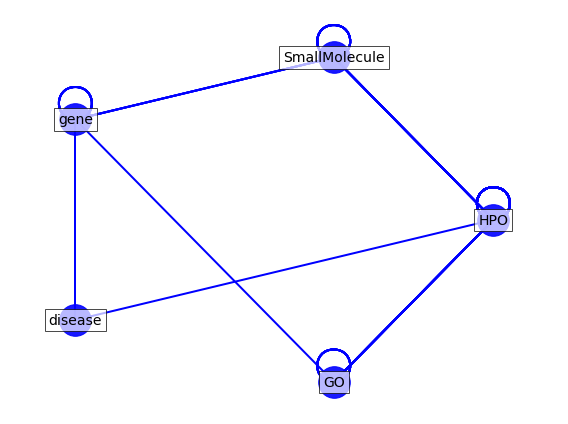

In [10]:
fig, ax = plt.subplots(figsize=(8, 6))

pos = nx.circular_layout(disease_metagraph)

# Visualize graph components
nx.draw_networkx_edges(disease_metagraph, pos, alpha=1,edge_color="blue",width=2)
nx.draw_networkx_nodes(disease_metagraph, pos, node_color="blue", alpha=0.9,node_size=1000)
label_options = {"ec": "k", "fc": "white", "alpha": 0.7}
nx.draw_networkx_labels(disease_metagraph, pos, font_size=14, bbox=label_options)
ax.margins(0.1, 0.05)
fig.tight_layout()
plt.axis("off")
plt.savefig("../fig/disease_metagraph.png",dpi=300)

## Split out the nodes into the relevant input types

In [6]:
diseases = [n for n in disease_ontograph.nodes if disease_ontograph.nodes[n].get('label') ==  'disease']

In [7]:
genes = [n for n in disease_ontograph.nodes if disease_ontograph.nodes[n].get('label') ==  'gene']

HPO_terms = [n for n in disease_ontograph.nodes if disease_ontograph.nodes[n].get('label') ==  'HPO']
GO_terms = [n for n in disease_ontograph.nodes if disease_ontograph.nodes[n].get('label') ==  'GO']
small_molecules = [n for n in disease_ontograph.nodes if disease_ontograph.nodes[n].get('label') ==  'SmallMolecule']

In [8]:
len(diseases)

3242

In [9]:
def flatten(t):
    return [item for sublist in t for item in sublist]


In [10]:

diseases_neighbors = [disease_ontograph.neighbors(n) for n in disease_ontograph.nodes if disease_ontograph.nodes[n].get('label') ==  'disease']

disease_HPO = set(flatten([[n for n in dn if disease_ontograph.nodes[n].get('label') ==  'HPO'] for dn in diseases_neighbors]))

## Degree distribution

The degree of a node is defined as the number of edges that are connected to that node. 
The distribution of degree values tells us about the high level architechture of the network. Scale free networks, which are common in biology, are characterized by a powerlaw distribution of degree, i.e. linear on a log-log scale


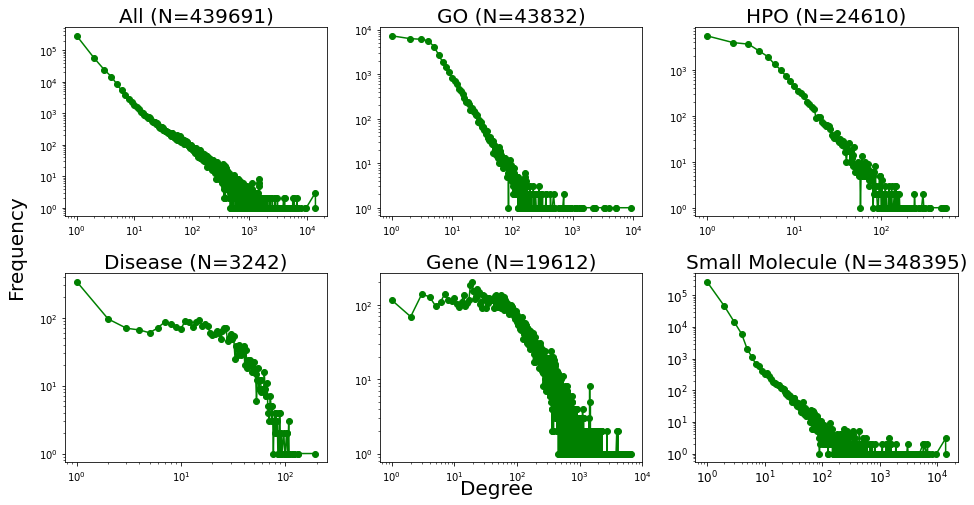

In [16]:
fig = plt.figure(figsize=(16, 8), facecolor='w', edgecolor='k')

for i, node_type in enumerate(['all','GO','HPO','disease','gene','Small Molecule']):
    if node_type == 'all':
    
        degree_sequence = sorted([d for n, d in disease_ontograph.degree()], reverse=True)
    
    elif node_type == 'Small Molecule':
    
        degree_sequence = sorted([d for n, d in disease_ontograph.degree() if disease_ontograph.nodes[n].get('label') == 'SmallMolecule'], reverse=True)

    else:
        degree_sequence = sorted([d for n, d in disease_ontograph.degree() if disease_ontograph.nodes[n].get('label') == node_type], reverse=True)
    
    degreeCount = Counter(degree_sequence)
    deg, cnt = zip(*degreeCount.items())
    
    plt.subplot(2,3,i+1)
    plt.loglog(deg, cnt,'go-') 
    #plt.xlabel('Degree',fontsize = 12,labelpad= -4)
    #plt.ylabel('Frequency',fontsize = 12)
    if node_type in ['all','disease','gene']:
        plt.title(str.title(node_type) + ' (N={0})'.format(sum(cnt)),size=20)
    else:
        plt.title(node_type + ' (N={0})'.format(sum(cnt)),size=20)

plt.subplots_adjust(hspace=0.3)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
fig.text(0.5, 0.07, 'Degree', ha='center',size=20)
fig.text(0.075, 0.5, 'Frequency', va='center', rotation='vertical',size=20)
plt.show()

In [17]:
small_molecule_degree = {}
for n,d in disease_ontograph.degree():
    if disease_ontograph.nodes[n].get('label') == 'SmallMolecule':
        if d in small_molecule_degree:
            small_molecule_degree[d].append(n)
        else:
            small_molecule_degree[d] = [n]

In [18]:
{i:small_molecule_degree[i] for i in sorted(small_molecule_degree.keys(),reverse=True)}

{14021: ['CHEMBL:CHEMBL109'],
 13994: ['CHEMBL:CHEMBL2105613', 'PUBCHEM:3549980', 'CHEMBL:CHEMBL433'],
 9708: ['CHEMBL:CHEMBL1697694'],
 8014: ['CHEMBL:CHEMBL160'],
 7083: ['CHEMBL:CHEMBL112'],
 6775: ['CHEMBL:CHEMBL53463'],
 6761: ['CHEMBL:CHEMBL359744', 'PUBCHEM:40469134'],
 6754: ['CHEMBL:CHEMBL31184'],
 6516: ['PUBCHEM:23939'],
 6514: ['PUBCHEM:84691'],
 5923: ['PUBCHEM:24462', 'PUBCHEM:24463'],
 5770: ['CHEMBL:CHEMBL440084'],
 5752: ['CHEMBL:CHEMBL478629'],
 5740: ['CHEMBL:CHEMBL135'],
 5653: ['PUBCHEM:9811784', 'CHEMBL:CHEMBL1511'],
 4925: ['CHEMBL:CHEMBL99'],
 4800: ['CHEMBL:CHEMBL418971'],
 4710: ['CHEMBL:CHEMBL1909078'],
 4497: ['CHEMBL:CHEMBL38'],
 4398: ['CHEMBL:CHEMBL1235644'],
 4346: ['CHEMBL:CHEMBL462547'],
 4232: ['CHEMBL:CHEMBL3188292'],
 4099: ['CHEMBL:CHEMBL30327'],
 3956: ['CHEBI:35842'],
 3787: ['CHEMBL:CHEMBL313493'],
 3768: ['PUBCHEM:8253'],
 3745: ['CHEMBL:CHEMBL1957266'],
 3701: ['PUBCHEM:935'],
 3584: ['CHEMBL:CHEMBL384467'],
 3581: ['PUBCHEM:5359596'],
 3491: 

In [19]:
disease_ontograph['CHEMBL:CHEMBL109']

AdjacencyView({23474: {'chemical-affects': {}}, 4790: {'chemical-affects': {}}, 930: {'chemical-affects': {}}, 975: {'chemical-affects': {}}, 1380: {'chemical-affects': {}}, 5580: {'chemical-affects': {}}, 4791: {'chemical-affects': {}}, 8742: {'chemical-affects': {}}, 4582: {'chemical-affects': {}}, 285: {'chemical-affects': {}}, 6774: {'chemical-affects': {}}, 3815: {'chemical-affects': {}}, 84823: {'chemical-affects': {}}, 93986: {'chemical-affects': {}}, 3728: {'chemical-affects': {}}, 7299: {'chemical-affects': {}}, 83938: {'chemical-affects': {}}, 64327: {'chemical-affects': {}}, 6469: {'chemical-affects': {}}, 7010: {'chemical-affects': {}}, 5080: {'chemical-affects': {}}, 3708: {'chemical-affects': {}}, 3043: {'chemical-affects': {}}, 3251: {'chemical-affects': {}}, 728294: {'chemical-affects': {}}, 3418: {'chemical-affects': {}}, 1280: {'chemical-affects': {}}, 5277: {'chemical-affects': {}}, 23236: {'chemical-affects': {}}, 6323: {'chemical-affects': {}}, 57582: {'chemical-af

## Paths between disease nodes

In [11]:
disease_pairs = [i for i in combinations(diseases,2)]

In [12]:
disease_pairs = [i for i in combinations(diseases,2)]
shortest_paths = []
for dis_t, dis_s in disease_pairs:
    try:
        shortest_paths.append(nx.shortest_path(disease_ontograph,source=dis_t,target=dis_s))
    except:
        continue

In [13]:
Counter([len(i) - 1  for i in shortest_paths])

Counter({2: 1166895, 3: 624424, 4: 3075865, 5: 366150, 6: 20327})

## Shortest paths

In [14]:
disease_pairs = [i for i in combinations(diseases,2)]
shortest_paths = []
for dis_t, dis_s in disease_pairs:
    try:
        shortest_paths.append(nx.shortest_path(disease_ontograph,source=dis_t,target=dis_s))
    except:
        continue

In [18]:
path_count = Counter(sorted([len(i) - 1  for i in shortest_paths], reverse=True))

In [19]:
deg, cnt = zip(*path_count.items())

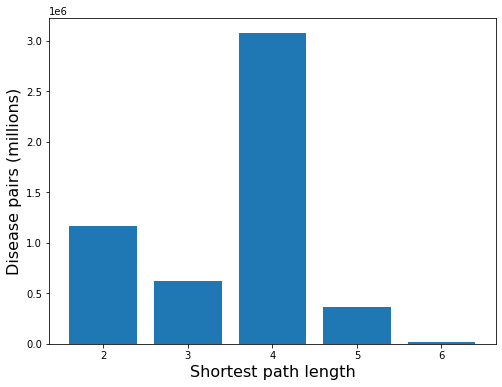

In [20]:
fig = plt.figure(figsize=(8, 6), facecolor='w', edgecolor='k')

plt.bar(deg,cnt)
plt.xlabel("Shortest path length",size=16)
plt.ylabel("Disease pairs (millions)",size=16)
plt.show()

**Note:** 2 and 4 are the most common path lengths. There are no direct connections between disease nodes. Paths of 2 imply a shared gene or phenotype. Paths of length 4 imply a genes or phenotypes with shared superclass one level up the ontology OR a path through an intermediate disease.

In [21]:
diseases_neighbors = set(flatten([[i for i in disease_ontograph.neighbors(n)] for n in disease_ontograph.nodes if disease_ontograph.nodes[n].get('label') ==  'disease']))
diseases_neighbors_2nd = set(flatten([[i for i in disease_ontograph.neighbors(n)] for n in diseases_neighbors]))


In [22]:
disease_shell = disease_ontograph_serialized.subgraph(flatten([diseases_neighbors,diseases_neighbors_2nd]))

In [23]:
disease_neighbor_types= [[disease_ontograph.nodes[i].get('label') for i in disease_ontograph.neighbors(n)] for n in disease_ontograph.nodes if disease_ontograph.nodes[n].get('label') ==  'disease']

In [24]:
neighbor_type_counts = []
for dt in disease_neighbor_types:
    dt_count = Counter(dt)
    if 'gene' not in dt_count:
        dt_count['gene'] = 0
    if 'HPO' not in dt_count:
        dt_count['HPO'] = 0
    if 'GO' in dt_count:
        dt_count['HPO'] += dt_count['GO']
        dt_count.pop('GO')
    neighbor_type_counts.append(dt_count)

In [25]:
type_count_df = pd.DataFrame(neighbor_type_counts)
type_count_df['Total'] = type_count_df['gene'] + type_count_df['HPO']
type_count_df['Prop. HPO'] = type_count_df['HPO']/type_count_df['Total'] 


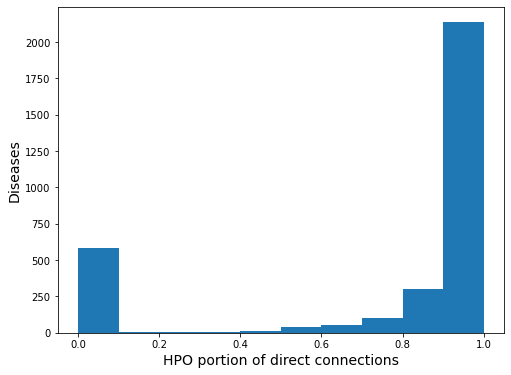

In [26]:
fig = plt.figure(figsize=(8, 6), facecolor='w', edgecolor='k')

plt.hist(type_count_df['Prop. HPO'])
plt.xlabel('HPO portion of direct connections',size=14)
plt.ylabel('Diseases',size=14)
plt.show()

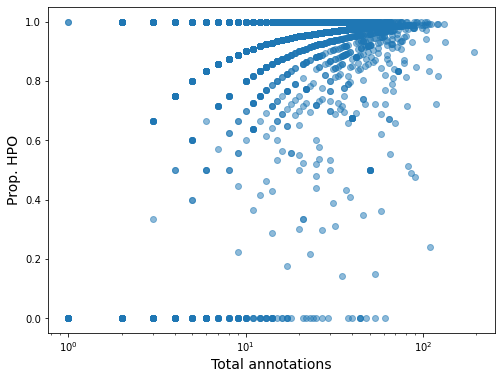

In [27]:
fig = plt.figure(figsize=(8, 6), facecolor='w', edgecolor='k')

plt.scatter(type_count_df['Total'],type_count_df['Prop. HPO'],alpha=0.5)
plt.semilogx()
plt.ylabel('Prop. HPO',size=14)
plt.xlabel('Total annotations',size=14)
plt.show()

In [28]:
nbins=300
k = kde.gaussian_kde([type_count_df['Total'],type_count_df['Prop. HPO']])
xi, yi = np.mgrid[type_count_df['Total'].min():type_count_df['Total'].max():nbins*1j, type_count_df['Prop. HPO'].min():type_count_df['Prop. HPO'].max():nbins*1j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))

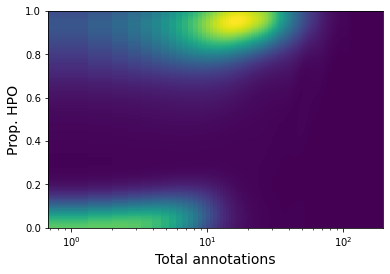

In [29]:
# Make the plot
plt.pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto')
plt.semilogx()
plt.ylabel('Prop. HPO',size=14)
plt.xlabel('Total annotations',size=14)
plt.show()